# Proyecto 2 y 4: Análisis de mercado inmobiliario - Informe Final de Carrera


## Problema

Recientemente te has incorporado al equipo de Datos de una gran inmobiliaria. La primera tarea que se te asigna es ayudar a los tasadores/as a valuar las propiedades, ya que es un proceso difícil y, a veces, subjetivo. Para ello, propones crear un modelo de Machine Learning que, dadas ciertas características de la propiedad, prediga su precio de venta.


0. Importa las librerías necesarias para trabajar en la consigna.

In [131]:
import pandas as pd
import numpy as np
import seaborn as sn
import matplotlib.pyplot as plt

In [132]:
#!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

## Proyecto 1

## Primer paso: Explorar el Dataset

In [133]:
prop=pd.read_csv('Properati.csv')

In [134]:
print(f'Cantidad de filas: {prop.shape[0]}')
print(f'Cantidad de columnas: {prop.shape[1]}')
prop.head(5)

Cantidad de filas: 146660
Cantidad de columnas: 19


,start_date,end_date,created_on,lat,lon,l1,l2,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,currency,title,description,property_type,operation_type
0,2019-10-17,2019-12-23,2019-10-17,-34.605880,-58.384949,Argentina,Capital Federal,San Cristobal,7.0,7.0,2.0,140.0,140.0,153000.0,USD,"***Venta semipiso centro, ideal hostel*****",DESCRIPCION DE LA PROPIEDAD: Departamento de 1...,Departamento,Venta
1,2019-10-17,2019-11-21,2019-10-17,-34.624056,-58.412110,Argentina,Capital Federal,Boedo,2.0,1.0,2.0,70.0,58.0,159000.0,USD,Espectacular PH reciclado en Boedo sin expensas.,PH reciclado en Boedo a una cuadra de la plaz...,PH,Venta
2,2019-10-17,2019-11-01,2019-10-17,-34.593569,-58.427474,Argentina,Capital Federal,Palermo,2.0,1.0,1.0,45.0,45.0,125000.0,USD,Depto.tipo casa de 2 ambientes en Venta en Pal...,"2 ambienets amplio , excelente estado , patio ...",PH,Venta
3,2019-10-17,2019-12-23,2019-10-17,-34.581294,-58.436754,Argentina,Capital Federal,Palermo,2.0,1.0,1.0,85.0,50.0,295000.0,USD,COSTA RICA 5800 / PALERMO HOLLYWOOD / VENTA PH...,HERMOSO PH EN PALERMO!!!2 AMBIENTES TOTALMENTE...,PH,Venta
4,2019-10-17,2020-03-11,2019-10-17,-34.914194,-57.938219,Argentina,Bs.As. G.B.A. Zona Sur,La Plata,2.0,1.0,1.0,50.0,35.0,40000.0,USD,58 entre 1 y 2 Venta de departamento en ph.1 ...,58 entre 1 y 2 Venta de departamento en PH. P...,PH,Venta


2. **Valores Faltantes**: imprime en pantalla los nombres de las columnas y cuántos valores faltantes hay por columna.

In [135]:
print(f'\nNombre de las columnas:\n{list(prop.columns)}')
miss=prop.isnull().sum()
print(f'\nValores faltantes por columna\n{miss}')


Nombre de las columnas:
['start_date', 'end_date', 'created_on', 'lat', 'lon', 'l1', 'l2', 'l3', 'rooms', 'bedrooms', 'bathrooms', 'surface_total', 'surface_covered', 'price', 'currency', 'title', 'description', 'property_type', 'operation_type']

Valores faltantes por columna
start_date             0
end_date               0
created_on             0
lat                 9925
lon                 9959
l1                     0
l2                     0
l3                     0
rooms                  0
bedrooms               0
bathrooms           5957
surface_total      20527
surface_covered    21614
price                  0
currency               0
title                  0
description            0
property_type          0
operation_type         0
dtype: int64


3. **Tipos de propiedad**: ¿Cuántos tipos de propiedad hay publicados según este dataset?¿Cuántos instancias por cada tipo de propiedad hay en el dataset? Responde esta pregunta usando las funcionalidad de Pandas y con un gráfico apropiado de Seaborn. **Pistas**: Te puede ser útil googlear cómo rotar las etiquetas del eje x.

Tipos de propiedad 
Departamento       107326
Casa                21521
PH                  14298
Lote                 1312
Oficina               658
Otro                  374
Local comercial       325
Casa de campo         322
Depósito              265
Cochera               259
Name: property_type, dtype: int64


Text(0.5, 1.0, 'Principales tipos de propiedad registradas')

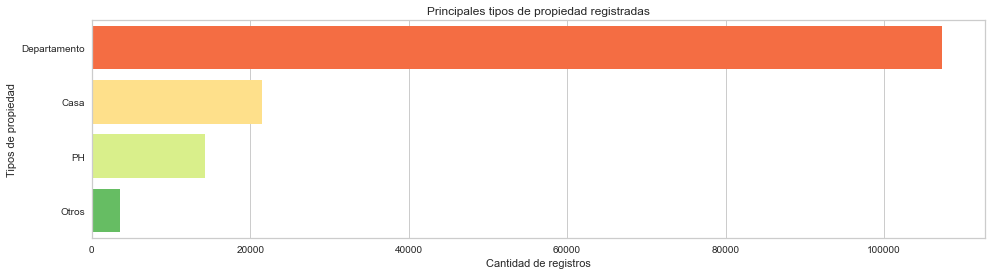

In [136]:
tipos=prop.property_type.isin((['PH', 'Departamento', 'Casa']))
tipos.sort_values(ascending=False, inplace=True)
print(f'Tipos de propiedad \n'+ str(prop.property_type.value_counts()))
prop.loc[- prop.property_type.isin(['PH', 'Departamento', 'Casa']), 'property_type'] = "Otros"
plt.figure(figsize=(16,4))
graf=sn.countplot(y=prop['property_type'], palette="RdYlGn",saturation=1.0,order=['Departamento','Casa','PH','Otros'])
graf.set_ylabel('Tipos de propiedad')
graf.set_xlabel('Cantidad de registros')
graf.set_title('Principales tipos de propiedad registradas')

4. ¿De qué regiones son las publicaciones? Haz gráficos de barras para las variables `l2` y `l3`. Si te animas, puedes hacer los dos gráficos usando `subplot` de Matplotlib. Dale un tamaño apropiado a la figura para que ambos gráficos se visualicen correctamente.

In [137]:
l2=prop['l2'].value_counts()
print('Cantidad de registros por zona \n'+ str(l2))
l3=prop['l3'].value_counts()
cap=prop['l2'].str.contains('Capital Federal')&prop['l3']
mascara=prop[cap]
cap=mascara['l3'].value_counts()
gba=prop['l2'].str.contains('G.B.A')&prop['l3']
mascara2=prop[gba]
gba=mascara2['l3'].value_counts()

Cantidad de registros por zona 
Capital Federal             92539
Bs.As. G.B.A. Zona Norte    24282
Bs.As. G.B.A. Zona Sur      17173
Bs.As. G.B.A. Zona Oeste    12666
Name: l2, dtype: int64



Barrio o localidad (son 89 en total)
Palermo            13073
Tigre               8718
Almagro             7527
Belgrano            6935
Caballito           6650
                   ...  
Cañuelas             108
Villa Soldati         69
Villa Riachuelo       42
Marcos Paz            35
Catalinas              5
Name: l3, Length: 89, dtype: int64


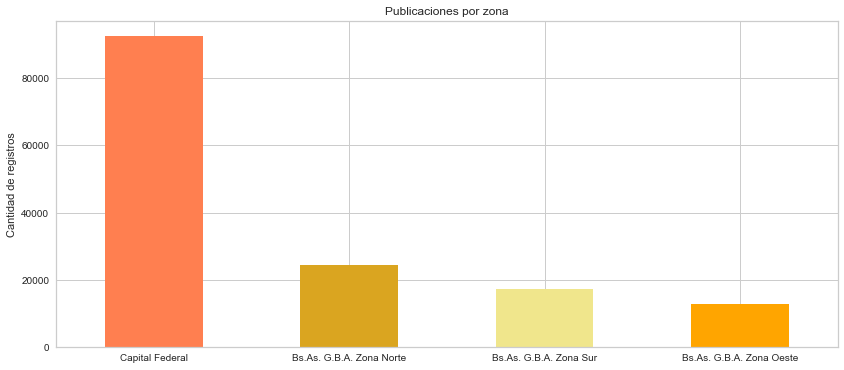

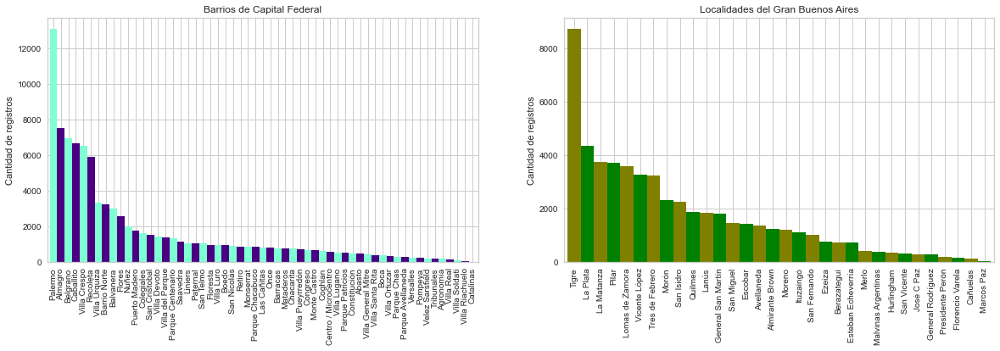

In [138]:
print(f'\nBarrio o localidad (son {len(l3)} en total)\n{l3}')
l2.plot(kind='bar',figsize=(14,6), color=['coral', 'goldenrod', 'khaki', 'orange', 'orchid'], 
        title='Publicaciones por zona',rot=0)
plt.ylabel('Cantidad de registros')
plt.figure(figsize = (10*2,5.3))
plt.subplot(1,2,2)
plt.ylabel('Cantidad de registros')
plt.xticks(rotation=0)
gba.plot(kind='bar',color=['olive','green'],width=1,title='Localidades del Gran Buenos Aires')
plt.subplot(1,2,1)
plt.ylabel('Cantidad de registros')
plt.xticks(rotation=0)
cap.plot(kind='bar',color=['aquamarine','indigo'],width=1, title='Barrios de Capital Federal')

5. **Filtrando el Dataset:** A partir de los resultados del punto 3. y 4., selecciona las tres clases más abundantes de tipos de propiedad y la región con más propiedades publicadas. Crea un nuevo Data Frame con aquellas instancias que cumplen con esas condiciones e imprime su `shape`.

In [139]:
#Las tres clases más abundantes de tipos de propiedad y la región con más propiedades publicadas
print('Los tres tipos de propiedad más importantes \n'+ str(prop.property_type.value_counts().head(3)))
print('\nLa región con más propiedades publicadas \n'+ str(l2.head(1)))
punto1=prop['l2'].str.contains('Capital Federal')
punto2=prop['property_type'].str.contains('Departamento|PH|Casa')
base1=prop[punto1&punto2]
base1=base1.drop(base1[base1.price>300000000].index)
print('\nCheckpoint: tamaño del nuevo dataset \n'+ str(base1.shape))

Los tres tipos de propiedad más importantes 
Departamento    107326
Casa             21521
PH               14298
Name: property_type, dtype: int64

La región con más propiedades publicadas 
Capital Federal    92539
Name: l2, dtype: int64

Checkpoint: tamaño del nuevo dataset 
(91485, 19)


**Checkpoint:** deberías tener un dataset con 91485 instacias, 19 columnas.

6. **Distribuciones y relaciones de a pares:** Estudia la distribución y las relaciones de a pares de las variables `rooms`, `bedrooms`, `bathrooms`, `surface_total`, `surface_covered`, `price` para cada tipo de propiedad. Para ello, ten en cuenta:
    1. Obtiene estadísticos que te sirvan para tener una primera idea de los valores que abarcan estas variables. ¿Cuáles crees que toman valores que tal vez no tengan mucho sentido?
    1. Algunas instancias tienen valores de superficie (`surface_total`) muy grandes y dificultan la correcta visualización. Estudia la distribución de esa variable y filtra por un valor razonable que te permita obtener gráficos comprensibles. Puede ser útil un boxplot para determinar un rango razonable.
    1. Lo mismo ocurre con valores de superficie total muy chico.
    1. Las propiedades no pueden tener `surface_covered` mayor a `surface_total`. Si eso sucede, debes filtrar esas instancias.
    1. El rango de precios que toman las propiedades es muy amplio. Estudia la distribución de esa variable y filtra por un valor razonable que te permita obtener gráficos comprensibles. Puede ser útil un boxplot para determinar un rango razonable.
    1. Una vez filtrado el dataset, puedes utilizar la función `pairplot` de Seaborn.

In [140]:
base=prop[['property_type','rooms','bedrooms','bathrooms','surface_total','surface_covered','price','l2','l3']]

In [141]:
ph=base['property_type'].str.contains('PH')
depto=base['property_type'].str.contains('Departamento')
ph=base[ph]
depto=base[depto]
casa=base['property_type'].str.contains('Casa')
casa=base[casa]
print(f'\nPromedios de las variables para PH\n{ph.mean()}')
print(f'\nValores máximos de las variables para PH\n{ph.max()}')
print(f'\nPromedios de las variables para Departamento \n{depto.mean()}')
print(f'\nValores máximos de las variables para Departamento\n{depto.max()}')
print(f'\nPromedios de las variables para Casa\n{casa.mean()}')
print(f'\nValores máximos de las variables para Casa\n{casa.max()}')




Promedios de las variables para PH
rooms                   3.533291
bedrooms                2.419569
bathrooms               1.485057
surface_total         172.982074
surface_covered       130.319805
price              188493.522800
dtype: float64

Valores máximos de las variables para PH
property_type                    PH
rooms                            35
bedrooms                         15
bathrooms                        11
surface_total                126062
surface_covered              126062
price                      1.75e+06
l2                  Capital Federal
l3                 Villa del Parque
dtype: object

Promedios de las variables para Departamento 
rooms                   2.756471
bedrooms                1.757813
bathrooms               1.508841
surface_total          99.191757
surface_covered        85.276315
price              236746.743110
dtype: float64

Valores máximos de las variables para Departamento
property_type          Departamento
rooms                  

## Considero que el valor de máximo de la superficie (tanto cubierta como total) en los tres tipos de propiedades parecen outliters, ya que no tiene sentido al compararse con su media.

## Los valores máximos de habitaciones y baños tampoco tienen sentido, pero deben estar correlacionados con los outliers de superficie.

Text(0.5, 0, 'Número de registro')

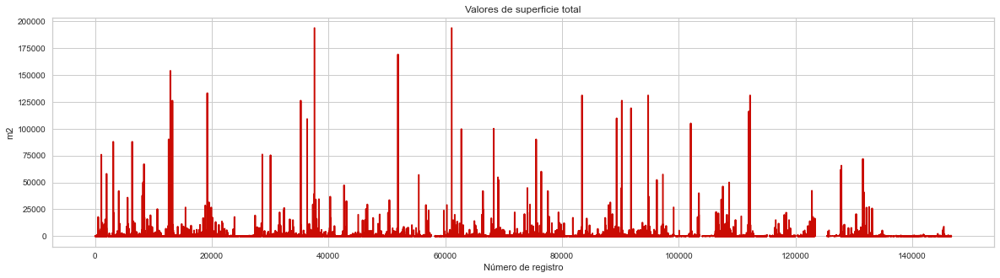

In [142]:
total=base['surface_total']
plt.rcParams["figure.figsize"] = (20,5)
plt.plot(total,'-',color='r', linewidth=2.0)
plt.title('Valores de superficie total')
plt.ylabel('m2')
plt.xlabel('Número de registro')

Text(0.5, 0, 'Número de registro')

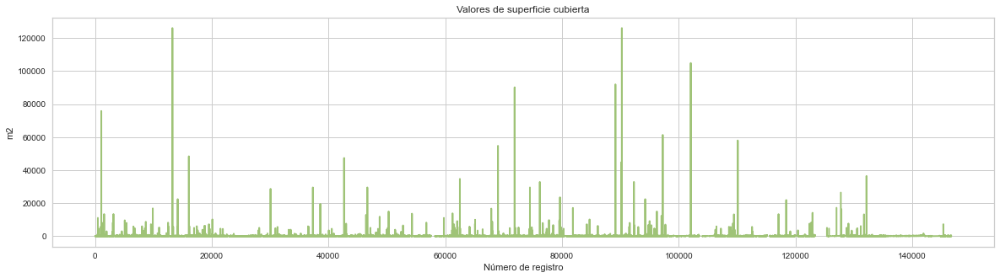

In [143]:
#Lo mismo ocurre con valores de superficie total muy chico.
cov=base['surface_covered']
plt.rcParams["figure.figsize"] = (20,5)
plt.plot(cov,'-',color='g', linewidth=2.0)
plt.title('Valores de superficie cubierta')
plt.ylabel('m2')
plt.xlabel('Número de registro')

Existen propiedades con mas de 120000 m2 en superficie cubierta y total

Se filtró el dataset eliminando aquellas propiedades con Superficie total menor a Superficie cubierta

Tamaño incial de registros 146660
Tamaño final de registros 123099


Text(0.5, 0, 'm2')

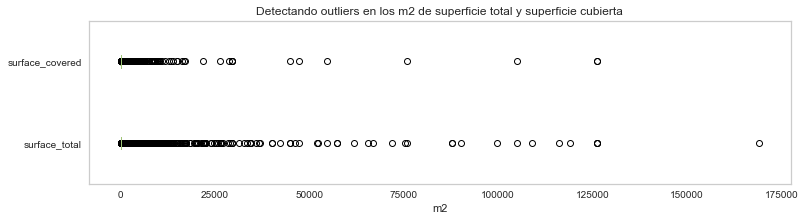

In [144]:
print('Existen propiedades con mas de 120000 m2 en superficie cubierta y total')
surface=base.loc[:,['surface_total','surface_covered']]
print('\nSe filtró el dataset eliminando aquellas propiedades con Superficie total menor a Superficie cubierta\n')
print('Tamaño incial de registros '+str(len(surface)))
mascara=base['surface_total']>=base['surface_covered']
base=base[mascara]
print('Tamaño final de registros '+str(len(base)))

base.boxplot(column=['surface_total','surface_covered'],vert=False,grid=False,figsize=(15,3),color='g')
plt.subplots_adjust(left=0.25)
plt.title('Detectando outliers en los m2 de superficie total y superficie cubierta')
plt.xlabel('m2')
#Las propiedades no pueden tener surface_covered mayor a surface_total. Si eso sucede, debes filtrar esas instancias.


Eliminé los outliers del gráfico por considerar muy subjetivo otro tipo de filtro, lo que me da indicio de que el corte debe ser aproximadamente en 450 m2 para superficie total
 y 320 m2 para superficie cubierta


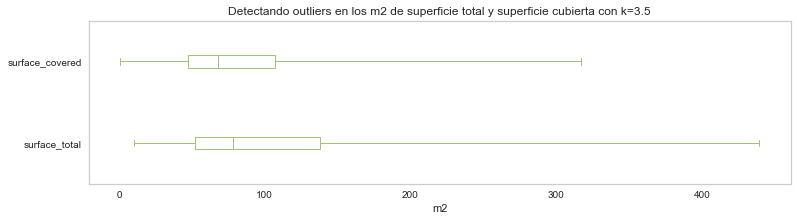

In [145]:
base.boxplot(['surface_total','surface_covered'],vert=False,grid=False,figsize=(15,3),color='g',whis=3.5,showfliers=False)
plt.subplots_adjust(left=0.25)
plt.xlabel('m2')
plt.title('Detectando outliers en los m2 de superficie total y superficie cubierta con k=3.5')
#whis: Como flotador, determina el alcance de los bigotes hasta más allá del primer y tercer cuartil. En otras palabras, donde IQR es el rango intercuartil (Q3-Q1), el bigote superior se extenderá al último dato menor que Q3 + whis * IQR). De manera similar, el bigote inferior se extenderá al primer dato mayor que Q1 - whis * IQR. Más allá de los bigotes, los datos se consideran valores atípicos y se representan como puntos individuales.
print('Eliminé los outliers del gráfico por considerar muy subjetivo otro tipo de filtro, lo que me da indicio de que el corte debe ser aproximadamente en 450 m2 para superficie total\n y 320 m2 para superficie cubierta')

In [146]:
mascara=base['surface_covered']<320
mascara2=base['surface_total']<450
base=base[mascara&mascara2]

Tamaño con superficie mayor a 10 m2 y
menor a 320 m2 cubierta y 450 m2 total: 116013


Text(0.5, 1.0, 'Detectando outliers en los m2 de superficie total y superficie cubierta con k=3.5')

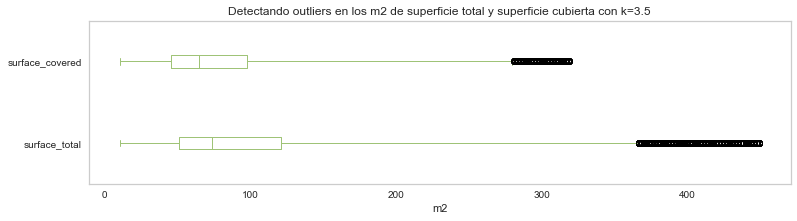

In [147]:
mascara=base['surface_covered']>10
mascara2=base['surface_total']>10
base=base[mascara&mascara2]
print(f'Tamaño con superficie mayor a 10 m2 y\nmenor a 320 m2 cubierta y 450 m2 total: {len(base)}')
base.boxplot(column=['surface_total','surface_covered'],vert=False,grid=False,figsize=(15,3),color='g',whis=3.5)
plt.subplots_adjust(left=0.25)
plt.xlabel('m2')
plt.title('Detectando outliers en los m2 de superficie total y superficie cubierta con k=3.5')

In [148]:
print('Detecto outliers en el precio. En este caso, el gráfico inicialmente alcanza un valor de USD 3.000.000.000, por lo que resulta pertinente filtrar la base para limitar el análisis a valores más reales ')

Detecto outliers en el precio. En este caso, el gráfico inicialmente alcanza un valor de USD 3.000.000.000, por lo que resulta pertinente filtrar la base para limitar el análisis a valores más reales 


C:\Users\florb\miniconda3\envs\datascience\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



Text(0.5, 0, 'Precio en millones de USD')

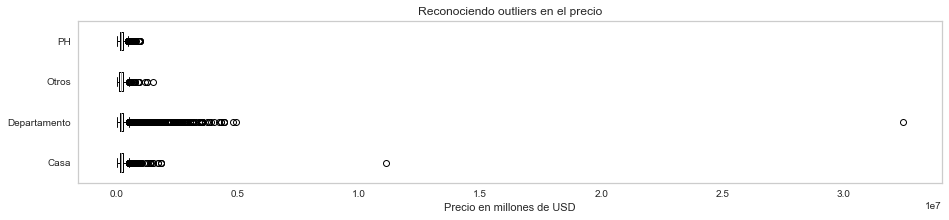

In [149]:
base.boxplot(column='price', by='property_type',figsize=(15,3),vert=False,grid=False)
plt.suptitle('')
plt.title('Reconociendo outliers en el precio')
plt.xlabel('Precio en millones de USD')

Precio máximo 32434232.0
Precio mínimo 6000.0
Filtro la base para eliminar outliers en el precio. El gráfico llega hasta USD 600.000 ya que limite la visualización de outliers


C:\Users\florb\miniconda3\envs\datascience\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



Text(0.5, 0, 'Precio en USD')

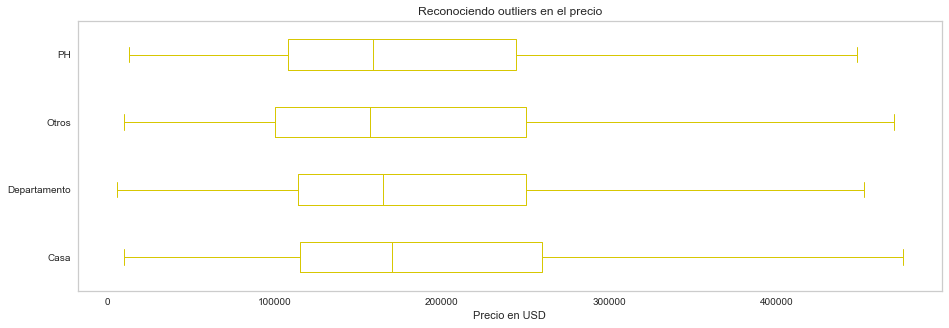

In [150]:
print('Precio máximo '+str(base['price'].max()))
print('Precio mínimo '+str(base['price'].min()))
print('Filtro la base para eliminar outliers en el precio. El gráfico llega hasta USD 600.000 ya que limite la visualización de outliers')
masc=base['price']<1000000
base=base[masc]
base.boxplot(column='price', by='property_type',figsize=(15,5),vert=False,grid=False,color='y',showfliers=False)
plt.suptitle('')
plt.title('Reconociendo outliers en el precio')
plt.xlabel('Precio en USD')

In [151]:
print("\033[1;30m"+f'\nCompruebo filtros aplicados hasta ahora: \nm2 máximos totales: {base.surface_total.max()}\nm2 máximos cubiertos: {base.surface_covered.max()}\nPrecio máximo: {base.price.max()}\nColumnas: {list(base)}')

print(f'Tamano de la base: {len(base)} datos')


Compruebo filtros aplicados hasta ahora: 
m2 máximos totales: 449.0
m2 máximos cubiertos: 319.0
Precio máximo: 999999.0
Columnas: ['property_type', 'rooms', 'bedrooms', 'bathrooms', 'surface_total', 'surface_covered', 'price', 'l2', 'l3']
Tamano de la base: 114317 datos


6. **Correlaciones:** Estudia la correlación entre las variables `rooms`, `bedrooms`, `bathrooms`, `surface_total`, `surface_covered`, `price`. ¿Cuáles son las mejores variables para predecir el precio?¿Qué diferencias encuentras según cada tipo de propiedad?


Tanto para PH como para Departamentos, la mejor variable para predecir el precio es la superficie total y cubierta.
En el caso de las Casas cambia la correlación y baja significativamente para superficie total


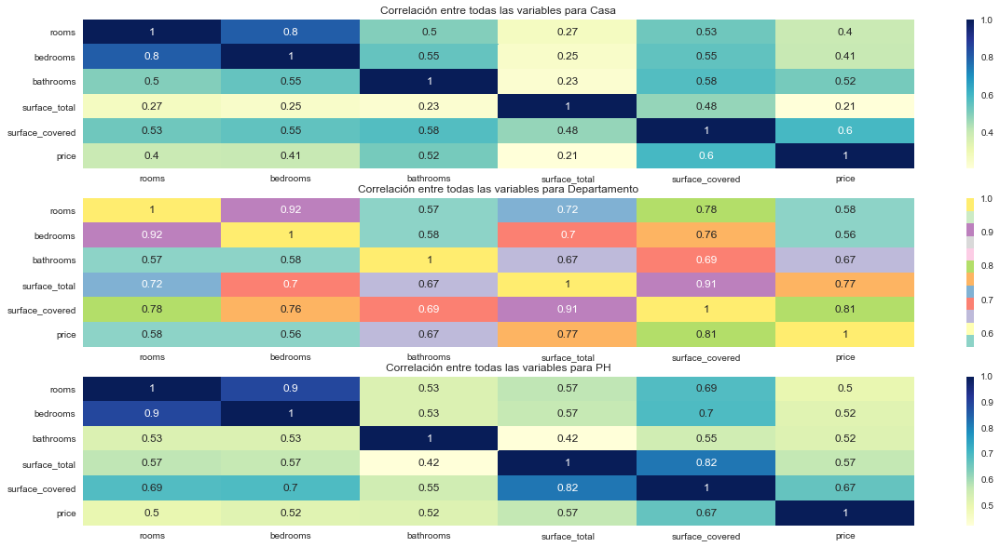

In [152]:
base1=base.loc[:,['rooms','bedrooms','bathrooms','surface_total','surface_covered','price']]
corr1=base[base['property_type']=='Casa'].corr()
corr2=base[base['property_type']=='Departamento'].corr()
corr3=base[base['property_type']=='PH'].corr()
plt.figure(figsize=(20,10))
plt.subplot(3,1,1)
graf=sn.heatmap(corr1,cmap="YlGnBu",annot=True,fmt='.2g')
graf.set_title('Correlación entre todas las variables para Casa')
plt.subplot(3,1,2)
graf2=sn.heatmap(corr2,cmap="Set3",annot=True,fmt='.2g')
graf2.set_title('Correlación entre todas las variables para Departamento')
plt.subplot(3,1,3)
graf3=sn.heatmap(corr3,cmap="YlGnBu",annot=True,fmt='.2g')
graf3.set_title('Correlación entre todas las variables para PH')
print('\nTanto para PH como para Departamentos, la mejor variable para predecir el precio es la superficie total y cubierta.\nEn el caso de las Casas cambia la correlación y baja significativamente para superficie total')

### 2.1 Desafío

**Valoración del m2 en CABA por tipos de propiedad y por barrio**

In [153]:
tipo=str(input("Estás buscando Casa o Departamento? "))
zona = str(input("En Capital o G.B.A? "))
if zona=='Capital':
    print(cap)
else:
    print(gba)
barrio=str(input('En qué barrio?'))
depto=base['property_type'].str.contains(tipo)&base['l2'].str.contains(zona)&base['l3'].str.contains(barrio)
cap=base[depto]
m2=(cap['price']/cap['surface_total']).mean()
if np.isnan(m2)==True:
    print(f'No hay {tipo}s disponibles en {barrio}')
else:
    print("\033[1;30m"+f'El valor promedio del m2 es de USD {"{0:.2f}".format(m2)}')


Estás buscando Casa o Departamento? Casa
En Capital o G.B.A? Capital
Palermo                 13073
Almagro                  7527
Belgrano                 6935
Caballito                6650
Villa Crespo             6494
Recoleta                 5917
Villa Urquiza            3339
Barrio Norte             3229
Balvanera                2992
Flores                   2556
Nuñez                    1978
Puerto Madero            1757
Colegiales               1599
San Cristobal            1537
Villa Devoto             1437
Villa del Parque         1361
Parque Centenario        1318
Saavedra                 1121
Liniers                  1054
Paternal                 1053
San Telmo                1032
Floresta                  950
Villa Luro                941
Boedo                     928
San Nicolás               911
Retiro                    852
Monserrat                 852
Parque Chacabuco          837
Las Cañitas               789
Once                      788
Barracas                  773
M

**Precio promedio de una propiedad según preferencias**

In [154]:
tipo=str(input("Estás buscando Casa o Departamento? "))
zona = str(input("En Capital o G.B.A? "))
if zona=='Capital':
    print(cap)
else:
    print(gba)
barrio=str(input("En qué barrio? "))
filtro2=base['property_type'].str.contains(tipo)&base['l2'].str.contains(zona)&base['l3'].str.contains(barrio)
filtro2=base[filtro2]
masc=filtro2['rooms']==int(input("Cuantos ambientes? ")) 
filtro2=filtro2[masc]
masc2=filtro2['bathrooms']==int(input("Cuántos baños? "))
filtro2=filtro2[masc2]
m2=(filtro2['price']).mean()
if np.isnan(m2)==True:
    print('No hay propiedades disponibles con dichas caracteristicas')
else:
    print("\033[1;30m"+f'El valor promedio de {tipo}s en {barrio} es de USD {"{0:.2f}".format(m2)}')

Estás buscando Casa o Departamento? Departamento
En Capital o G.B.A? Capital
Empty DataFrame
Columns: [property_type, rooms, bedrooms, bathrooms, surface_total, surface_covered, price, l2, l3]
Index: []
En qué barrio? Recolate
Cuantos ambientes? 2
Cuántos baños? 2
No hay propiedades disponibles con dichas caracteristicas


**Barrios o localidades más caras y más baratas según la zona**

In [155]:
tipo=str(input("Estás buscando Casa o Departamento? "))
zona = str(input("En Capital o G.B.A? "))
filtro2=base['property_type'].str.contains(tipo)&base['l2'].str.contains(zona)
filtro2=base[filtro2]
filtro2=filtro2.loc[:,['l3','price','surface_total']]
filtro2=filtro2.sort_values('price',ascending=False)
filtro2=filtro2.loc[:,['l3','price']]
caros=(filtro2.head(300))
caros=((caros['price']).mean()).round(3)
baratos=filtro2.tail(300)
baratos=((baratos['price']).mean()).round(3)

print(f'El valor promedio de {tipo}s en los barrios/localidades más caros de {zona} es:\nUSD {caros}\ny en los más baratos:\nUSD {baratos}')


Estás buscando Casa o Departamento? Casa
En Capital o G.B.A? Capital
El valor promedio de Casas en los barrios/localidades más caros de Capital es:
USD 587273.333
y en los más baratos:
USD 152026.143


### 3. Machine Learning

En esta sección, debes entrenar dos modelos de Machine Learning - uno de vecinos más cercanos y otro de árboles de decisión -  para predecir el precio de las propiedades tipo `Departamento` en la Ciudad Autónoma de Buenos Aires (`Capital Federal`). Para ello, no debes olvidarte de:

* Elegir una métrica apropiada para evaluar los resultados de los modelos.
* Seleccionar las variables predictoras (`X`) y la variable a predecir (`y`). 
* Realizar un Train/Test split de los datos.
* Generar un modelo *benchmark* y evaluarlo.
* Entrenar un modelo de vecinos más cercanos y un modelo de árbol de decisión con hiperparámetros iniciales de su elección.
* Evaluar los modelos obtenidos. Para ello, evalúa la métrica elegida en el conjunto de Test y en el conjunto de Train. También, realiza gráficos de valores reales vs. valores predichos.
* Mejorar el desempeño de sus modelos optimizando el número de vecinos y la profundidad del árbol, respectivamente.
* Entre los modelos entrenados, ¿cuál elegirías para utilizar?¿Por qué? 
* Ser **crítico/a** con la metodología utilizada. Por ejemplo, responde las siguientes preguntas: ¿Qué información no estás usando que podría ayudar al modelo?¿Qué información puede estar demás o repetida?

Estos lineamientos corresponden al **mínimo entregable** de esta sección.


**Importante:** para asegurarnos que trabajes con un dataset apropiados, debes volver a cargar los datos y realizar el siguiente filtrado:

1. Selecciona aquellas propiedades en Capital Federal y cuyo tipo de propiedad es Departamento, PH o Casa.
1. Selecciona aquellas propiedades cuya superficie total es menor a 1000 m2 y mayor a 15 m2.
1. Selecciona aquellas propiedades cuya precio es menor 4000000 dólares.
1. Selecciona las columnas `rooms`, `bedrooms`, `bathrooms`, `surface_total`, `surface_covered` y `price`.
1. Descarta aquellas instacias con valores faltantes.

**Checkpoint:** deberías obtener un dataset con 81021 instacias y 6 columnas.

In [156]:
prop=pd.read_csv('Properati.csv')

Primero se filtra la base con las indicaciones detalladas

In [157]:
masc1=prop[(prop['l2'].str.contains('Capital Federal'))&(prop['property_type'].str.contains('PH|Departamento|Casa'))]
masc2=masc1[(masc1['surface_total']>=15)&(masc1['surface_total']<=1000)]
base=masc2[masc2['price']<=4000000]

In [158]:
final1=base[['rooms','bedrooms','bathrooms','surface_total','surface_covered','price']]
final1=final1.dropna()
print("La base de Properati final para trabajar tiene {} filas con {} columnas.".format(*final1.shape))

La base de Properati final para trabajar tiene 81019 filas con 6 columnas.


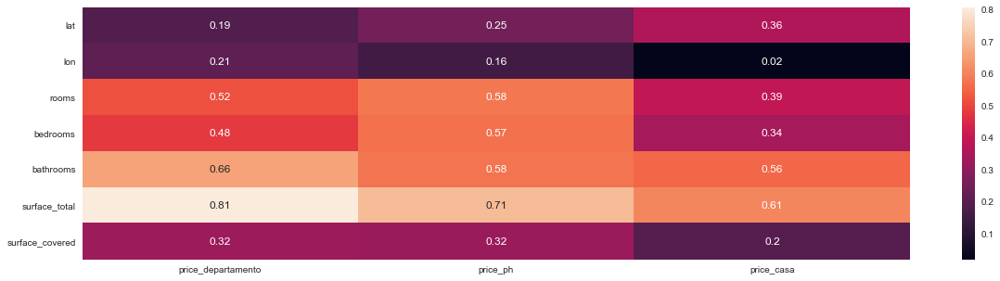

In [159]:
corr_summary = pd.DataFrame()
props = ['Departamento', 'PH', 'Casa']
for prop in props:
    mask = base.property_type == prop
    filtered_data = base[mask] # filtra por tipo de propiedad
    corr = filtered_data.corr() # calcula la matriz de correlacion
    corr = corr.drop(['price'], axis=1) # elimina la columna de precio
    corr_price = corr.iloc[-1] # toma la fila de precios
    corr_summary[f'price_{prop.lower()}'] = corr_price # adjunta el resultado al dataframe con el nombre en minuscula
sn.heatmap(corr_summary, annot=True)
plt.show()

#### Tanto para departamento, PH o Casa, la variable más correlacionada con el precio es la Superficie total de la propiedad, seguido por la cantidad de bañoa y, en tercer lugar la cantidad de ambientes (rooms).

In [160]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn import tree
from sklearn.metrics import mean_squared_error
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import r2_score
from sklearn.model_selection import RandomizedSearchCV
from matplotlib import cm
from scipy.stats import randint as sp_randint
from matplotlib import pyplot
from sklearn.model_selection import validation_curve

**Defino un MODELO BENCHMARK DE REGRESIÓN LINEAL con y=precios y X=superficie total (Conclusión a partir del gráfico pairplot)**


In [161]:
X=final1.surface_total
y=final1.price

**Entreno el Benchmark**

In [162]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42)

X_train=np.array(X_train)
X_train=X_train.reshape(-1,1)
X_test=np.array(X_test)
X_test=X_test.reshape(-1,1)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)
X_train=np.array(X_train)
X_train=X_train.reshape(-1,1)


(56713, 1) (56713,) (24306, 1) (24306,)


In [163]:
linear_model1 = LinearRegression()
linear_model1.fit(X_train, y_train)
print(f'Coeficiente: {linear_model1.coef_}\nIntercepto: {linear_model1.intercept_}')

Coeficiente: [2630.4146957]
Intercepto: 13037.407671383087


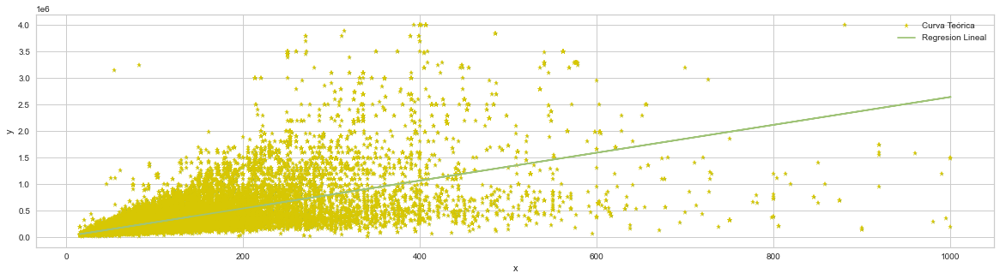

In [164]:
X=np.array(X)
X=X.reshape(-1,1)
plt.scatter(X,y, s = 2)
plt.plot(X, y, '*',label ='Curva Teórica', c = 'y')
plt.plot(X,linear_model1.predict(X),label ='Regresion Lineal', c = 'g')

plt.xlabel('x')
plt.ylabel('y')
plt.legend()



In [165]:
print('Las métricas a utilizar para evaluar cada modelo son:\nRMSE: Más sensibles a valores atípicos. Cuanto menor es, mejor estimado está el modelo. RMSE muestra que, si hay mucha diferencia entre el estimado para test y train es indicio de overfitting (con test mayor a train), underfitting caso contrario.\nR² del modelo\nR² para test y train')

Las métricas a utilizar para evaluar cada modelo son:
RMSE: Más sensibles a valores atípicos. Cuanto menor es, mejor estimado está el modelo. RMSE muestra que, si hay mucha diferencia entre el estimado para test y train es indicio de overfitting (con test mayor a train), underfitting caso contrario.
R² del modelo
R² para test y train


In [166]:
y_train_pred = linear_model1.predict(X_train)
y_test_pred = linear_model1.predict(X_test)
rmse_train1 = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test1 = np.sqrt(mean_squared_error(y_test, y_test_pred))
print(f'Raíz del error cuadrático medio en Train: {"{0:.2f}".format(rmse_train1)}')
print(f'Raíz del error cuadrático medio en Test: {"{0:.2f}".format(rmse_test1)}')
print(f'R² del modelo Benchmark: {"{0:.5f}".format(linear_model1.score(X,y))}')
print(f'R² score de train del modelo Benchmark: {"{0:.5f}".format(r2_score(y_train,y_train_pred))}')
print(f'R² score de test del modelo Benchmark: {"{0:.5f}".format(r2_score(y_test,y_test_pred))}')
scorelinear_model1=linear_model1.score(X,y)

Raíz del error cuadrático medio en Train: 216861.79
Raíz del error cuadrático medio en Test: 218633.41
R² del modelo Benchmark: 0.47118
R² score de train del modelo Benchmark: 0.46865
R² score de test del modelo Benchmark: 0.47691


**R² del Modelo Benchmark: 0.47118**

Text(0, 0.5, 'y test predicha')

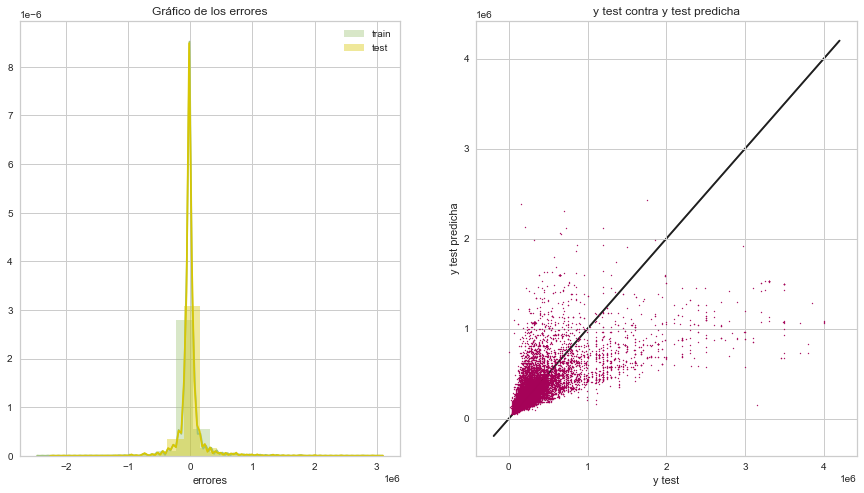

In [167]:
plt.figure(figsize = (15,8))
plt.subplot(1,2,1)
sn.distplot(y_train - y_train_pred, bins = 20, label = 'train',color='g')
sn.distplot(y_test - y_test_pred, bins = 20, label = 'test',color='y')
plt.title('Gráfico de los errores')
plt.xlabel('errores')
plt.legend()
ax = plt.subplot(1,2,2)
ax.scatter(y_test,y_test_pred, s =2,c='m',marker='*')   
lims = [
np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]    
ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)

ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
plt.title('y test contra y test predicha')
plt.xlabel('y test')
plt.ylabel('y test predicha')


**Agrego variables para mejorar la estimación del modelo. Para ello integro variables que no estaban en el enunciado**

In [168]:
print('Mejoro el modelo agregando lat y lon para especificar ubicación')
final2=base.loc[:,['rooms','bedrooms','bathrooms','surface_total','surface_covered','price','property_type','lat','lon','l2','l3']]
final2 = final2.dropna()
y=final2.price
x1=final2.surface_total
x2=final2.lat
x3=final2.lon

Mejoro el modelo agregando lat y lon para especificar ubicación


In [169]:
X = np.vstack((x1,x2,x3)).T
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)


(53739, 3) (53739,) (23032, 3) (23032,)


In [170]:
linear_model2 = LinearRegression()
linear_model2.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

**Elección de los mejores hiperparámetros para la Regresión Lineal del nuevo modelo**

In [171]:
param_dist = {'fit_intercept':[True,False],'normalize':[True,False]}

n_iter_search = 20
linear_model2rand = RandomizedSearchCV(estimator=linear_model2,
                           param_distributions=param_dist,
                           cv=5, verbose=1,
                           n_iter=n_iter_search)
linear_model2rand.fit(X,y)
params=linear_model2rand.best_params_
print(params,' ',linear_model2rand.best_score_)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


C:\Users\florb\miniconda3\envs\datascience\lib\site-packages\sklearn\model_selection\_search.py:277: UserWarning:

The total space of parameters 4 is smaller than n_iter=20. Running 4 iterations. For exhaustive searches, use GridSearchCV.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


{'normalize': True, 'fit_intercept': True}   0.5173809301328255


[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:    0.1s finished


In [172]:
#Teniendo en cuenta el hiperparametro óptimo, hago la Regresión Lineal para obtener el RMSE y el R²
linear_model2rand=LinearRegression(normalize=True,fit_intercept=True)
linear_model2rand.fit(X_train, y_train)
y_train_pred = linear_model2rand.predict(X_train)
y_test_pred = linear_model2rand.predict(X_test)
rmse_train2rand = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test2rand = np.sqrt(mean_squared_error(y_test, y_test_pred))
print(f'Raíz del error cuadrático medio en Train: {"{0:.2f}".format(rmse_train2rand)}')
print(f'Raíz del error cuadrático medio en Test: {"{0:.2f}".format(rmse_test2rand)}')
print(f'R² del modelo Benchmark: {"{0:.5f}".format(linear_model2rand.score(X,y))}')
print(f'R² score de train del modelo Benchmark: {"{0:.5f}".format(r2_score(y_train,y_train_pred))}')
print(f'R² score de test del modelo Benchmark: {"{0:.5f}".format(r2_score(y_test,y_test_pred))}')
scorelinear_model2rand=linear_model2rand.score(X,y)

Raíz del error cuadrático medio en Train: 200169.28
Raíz del error cuadrático medio en Test: 189792.07
R² del modelo Benchmark: 0.52641
R² score de train del modelo Benchmark: 0.52221
R² score de test del modelo Benchmark: 0.53696


Gráfico de errores y de y contra y predicha para Regresión Lineal


Text(0, 0.5, 'y test predicha')

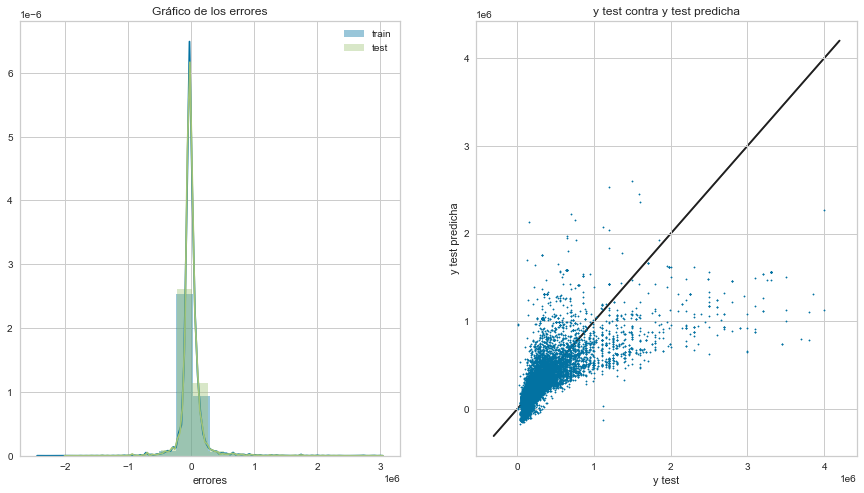

In [173]:
print('Gráfico de errores y de y contra y predicha para Regresión Lineal')
plt.figure(figsize = (15,8))
plt.subplot(1,2,1)
sn.distplot(y_train - y_train_pred, bins = 20, label = 'train')
sn.distplot(y_test - y_test_pred, bins = 20, label = 'test')
plt.xlabel('errores')
plt.title('Gráfico de los errores')
plt.legend()
ax = plt.subplot(1,2,2)
ax.scatter(y_test,y_test_pred, s =2)   
lims = [
np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]    
ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)

ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
plt.title('y test contra y test predicha')
plt.xlabel('y test')
plt.ylabel('y test predicha')

In [174]:
nombres=['Superficie Total','Latitud','Longitud']
importance = linear_model2rand.coef_
j=0
for i in importance:
        print(f'Coeficiente de {nombres[j]}: {i}')
        j=j+1

Coeficiente de Superficie Total: 2527.395254003927
Coeficiente de Latitud: 2419819.9143341747
Coeficiente de Longitud: 1384619.73317614


**Elección de los mejores hiperparámetros para el Árbol de decisión del nuevo modelo**

In [175]:
tree1 = DecisionTreeRegressor()
tree1.fit(X_train, y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [176]:
param_dist = {'max_depth': sp_randint(2, 50),'max_features':sp_randint(1, 3),'ccp_alpha':sp_randint(0, 5),'random_state':sp_randint(1,60)}

n_iter_search = 20
tree1rand = RandomizedSearchCV(estimator=tree1,
                           param_distributions=param_dist,
                           cv=5, n_jobs=None, verbose=1,
                           n_iter=n_iter_search)
tree1rand.fit(X_train, y_train)
params=tree1rand.best_params_
print(params,' ',tree1rand.best_score_)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.5s finished


{'ccp_alpha': 3, 'max_depth': 18, 'max_features': 2, 'random_state': 3}   0.8674406349177939


In [177]:
#Teniendo en cuenta el hiperparametro óptimo, hago el Árbol de decisión para obtener el RMSE y el R².
print('Varian  todos los parámetros cada vez que se aplica el código, pero se mantienen en la misma linea siempre (generando un indicio de overfitting)\n')
tree1rand=DecisionTreeRegressor(max_depth=48,max_features=2,random_state=58,ccp_alpha=0)
tree1rand.fit(X_train, y_train)
y_train_pred = tree1rand.predict(X_train)
y_test_pred = tree1rand.predict(X_test)
rmse_traintree1rand = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_testtree1rand = np.sqrt(mean_squared_error(y_test, y_test_pred))
print(f'Raíz del error cuadrático medio en Train: {"{0:.2f}".format(rmse_traintree1rand)}')
print(f'Raíz del error cuadrático medio en Test: {"{0:.2f}".format(rmse_testtree1rand)}')
print(f'R² del modelo Benchmark: {"{0:.5f}".format(tree1rand.score(X,y))}')
print(f'R² score de train del modelo Benchmark: {"{0:.5f}".format(r2_score(y_train,y_train_pred))}')
print(f'R² score de test del modelo Benchmark: {"{0:.5f}".format(r2_score(y_test,y_test_pred))}')
scoretree1rand=tree1rand.score(X,y)

Varian  todos los parámetros cada vez que se aplica el código, pero se mantienen en la misma linea siempre (generando un indicio de overfitting)

Raíz del error cuadrático medio en Train: 17296.61
Raíz del error cuadrático medio en Test: 103724.98
R² del modelo Benchmark: 0.95810
R² score de train del modelo Benchmark: 0.99643
R² score de test del modelo Benchmark: 0.86170


In [178]:
print('IMPORTANTE: Hay mucha diferencia entre Train y Test: indicio de overfitting. Puede ser ya que el max_depth es muy alto')

IMPORTANTE: Hay mucha diferencia entre Train y Test: indicio de overfitting. Puede ser ya que el max_depth es muy alto


Gráfico de errores y de y contra y predicha para Árbol de decisión


Text(0, 0.5, 'y test predicha')

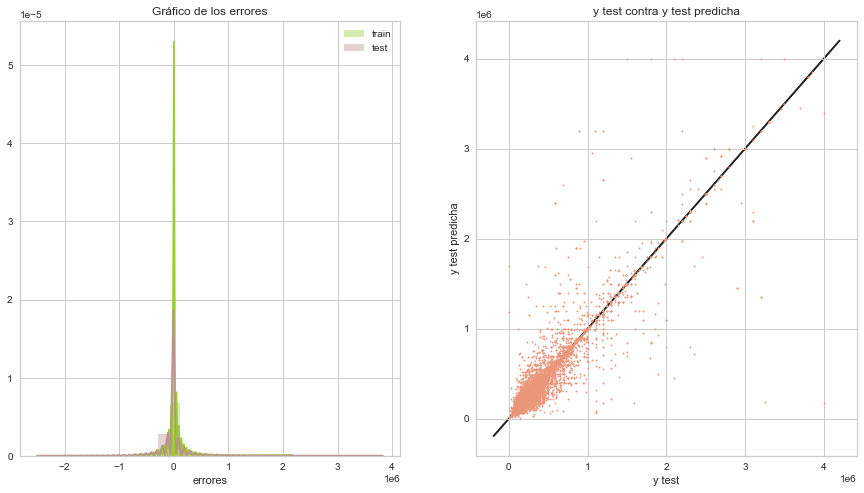

In [179]:
print('Gráfico de errores y de y contra y predicha para Árbol de decisión')
plt.figure(figsize = (15,8))
plt.subplot(1,2,1)
sn.distplot(y_train - y_train_pred, bins = 20, label = 'train',color='yellowgreen')
sn.distplot(y_test - y_test_pred, bins = 20, label = 'test',color='rosybrown')
plt.xlabel('errores')
plt.title('Gráfico de los errores')
plt.legend()
ax = plt.subplot(1,2,2)
ax.scatter(y_test,y_test_pred, s =2,c='darksalmon')   
lims = [
np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]    
ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)

ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
plt.xlabel('y test')
plt.title('y test contra y test predicha')
plt.ylabel('y test predicha')

In [180]:
print('Busco el mejor valor para max_depth según los features')

Busco el mejor valor para max_depth según los features


Text(0, 0.5, 'R² Score')

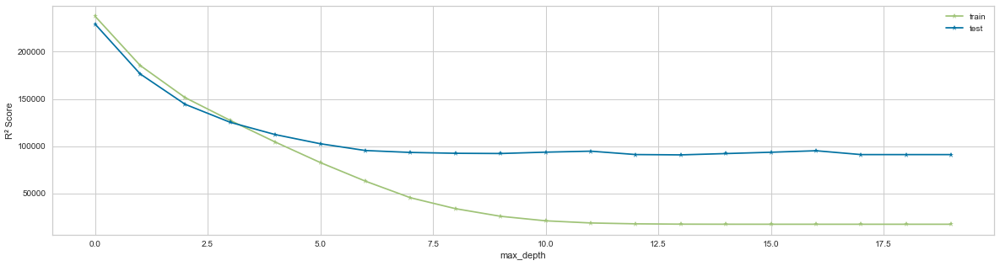

In [181]:
lista_rmse_train = []
lista_rmse_test = []
max_depths = np.linspace(1,40,20)
for i in max_depths:
    tree = DecisionTreeRegressor(max_depth=i, random_state = 42)
    tree.fit(X_train,y_train)
    # Predecir y evaluar sobre el set de entrenamiento
    y_train_pred = tree.predict(X_train)
    rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
    # Predecir y evaluar sobre el set de evaluación
    y_test_pred = tree.predict(X_test)
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
    # Agregar la información a las listas
    lista_rmse_train.append(rmse_train)
    lista_rmse_test.append(rmse_test)
plt.plot(lista_rmse_train,'*-',label='train',color='g')
plt.plot(lista_rmse_test,'*-',label='test',color='b')
plt.legend()
plt.xlabel('max_depth')
plt.ylabel('R² Score')

**Bajo profundidad del árbol y agrego la x que discrimina para eliminar overfitting. Además, establezco random_state=42 por considerarse óptimo**

In [182]:
tree2=DecisionTreeRegressor(max_depth=5,max_features=3,random_state=42)
tree2.fit(X_train, y_train)
y_train_pred = tree2.predict(X_train)
y_test_pred = tree2.predict(X_test)
rmse_traintree2 = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_testtree2 = np.sqrt(mean_squared_error(y_test, y_test_pred))
print(f'Raíz del error cuadrático medio en Train: {"{0:.2f}".format(rmse_traintree2)}')
print(f'Raíz del error cuadrático medio en Test: {"{0:.2f}".format(rmse_testtree2)}')
print(f'R² del modelo Benchmark: {"{0:.5f}".format(tree2.score(X,y))}')
print(f'R² score de train del modelo Benchmark: {"{0:.5f}".format(r2_score(y_train,y_train_pred))}')
print(f'R² score de test del modelo Benchmark: {"{0:.5f}".format(r2_score(y_test,y_test_pred))}')
scoretree2=tree2.score(X,y)

Raíz del error cuadrático medio en Train: 151389.57
Raíz del error cuadrático medio en Test: 144324.13
R² del modelo Benchmark: 0.72828
R² score de train del modelo Benchmark: 0.72670
R² score de test del modelo Benchmark: 0.73224


**Elección de los mejores hiperparámetros para el nuevo modelo con Knn**

In [183]:
knn1=KNeighborsRegressor()
knn1.fit(X_train,y_train)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                    weights='uniform')

In [184]:
n_neighbors = [int(x) for x in np.linspace(1,100,20)]   
weights = ['uniform','distance']
metric = ['euclidean','manhattan','chebyshev','seuclidean','minkowski'] 
random_grid = {
    'n_neighbors': n_neighbors,
    'weights': weights,
    'metric': metric,
}
n_iter_search = 20
knn1 = RandomizedSearchCV(estimator=knn1,
                           param_distributions=random_grid,
                           cv=5, n_jobs=None, verbose=1,
                           n_iter=n_iter_search)
knn1.fit(X_train, y_train)
params=knn1.best_params_
print(params,' ',knn1.best_score_)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
C:\Users\florb\miniconda3\envs\datascience\lib\site-packages\sklearn\model_selection\_validation.py:532: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
TypeError: __init__() takes exactly 1 positional argument (0 given)


C:\Users\florb\miniconda3\envs\datascience\lib\site-packages\sklearn\model_selection\_validation.py:532: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
TypeError: __init__() takes exactly 1 positional argument (0 given)


C:\Users\florb\miniconda3\envs\datascience\lib\site-packages\sklearn\model_selection\_validation.py:532: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
TypeError: __init__() takes exactly 1 positional argument (0 given)


C

{'weights': 'distance', 'n_neighbors': 47, 'metric': 'manhattan'}   0.8159774421240236


C:\Users\florb\miniconda3\envs\datascience\lib\site-packages\sklearn\model_selection\_validation.py:532: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
TypeError: __init__() takes exactly 1 positional argument (0 given)


C:\Users\florb\miniconda3\envs\datascience\lib\site-packages\sklearn\model_selection\_validation.py:532: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
TypeError: __init__() takes exactly 1 positional argument (0 given)


C:\Users\florb\miniconda3\envs\datascience\lib\site-packages\sklearn\model_selection\_validation.py:532: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
TypeError: __init__() takes exactly 1 positional argument (0 given)


C:\Users\florb\miniconda3\envs\datascience\lib\site-packages\sklearn\model_selecti

In [185]:
#Teniendo en cuenta el hiperparametro óptimo, hago el Modelo de Knn para obtener el RMSE y el R²
print('Cada vez que se usa RandomizedSearchCV varía los hiperparámetros a utilizar')
knnrand1=KNeighborsRegressor(n_neighbors=16,weights='distance',metric='minkowski')
knnrand1.fit(X_train, y_train)
y_train_pred = knnrand1.predict(X_train)
y_test_pred = knnrand1.predict(X_test)
rmse_trainknnrand1 = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_testknnrand1 = np.sqrt(mean_squared_error(y_test, y_test_pred))
print(f'Raíz del error cuadrático medio en Train: {"{0:.2f}".format(rmse_trainknnrand1)}')
print(f'Raíz del error cuadrático medio en Test: {"{0:.2f}".format(rmse_testknnrand1)}')
print(f'R² del modelo Benchmark: {"{0:.5f}".format(knnrand1.score(X,y))}')
print(f'R² score de train del modelo Benchmark: {"{0:.5f}".format(r2_score(y_train,y_train_pred))}')
print(f'R² score de test del modelo Benchmark: {"{0:.5f}".format(r2_score(y_test,y_test_pred))}')
scoreknnrand1=knnrand1.score(X,y)

Cada vez que se usa RandomizedSearchCV varía los hiperparámetros a utilizar
Raíz del error cuadrático medio en Train: 17168.08
Raíz del error cuadrático medio en Test: 110812.58
R² del modelo Benchmark: 0.95258
R² score de train del modelo Benchmark: 0.99649
R² score de test del modelo Benchmark: 0.84215


In [186]:
print('IMPORTANTE: Hay mucha diferencia entre Train y Test: indicio de overfitting. weights=distance está haciendo overfitting')

IMPORTANTE: Hay mucha diferencia entre Train y Test: indicio de overfitting. weights=distance está haciendo overfitting


Gráfico de errores y de y contra y predicha para el modelo con Knn


Text(0, 0.5, 'y test predicha')

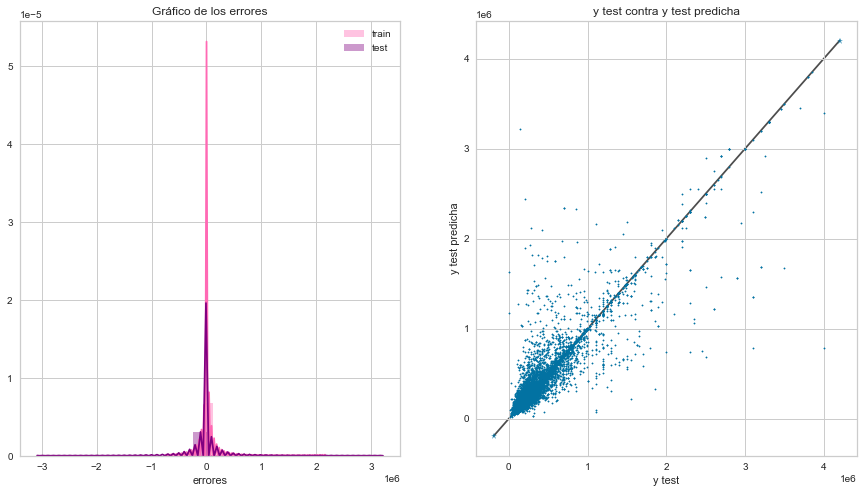

In [187]:
print('Gráfico de errores y de y contra y predicha para el modelo con Knn')
plt.figure(figsize = (15,8))
plt.subplot(1,2,1)
sn.distplot(y_train - y_train_pred, bins = 20, label = 'train',color='hotpink')
sn.distplot(y_test - y_test_pred, bins = 20, label = 'test',color='purple')
plt.xlabel('errores')
plt.title('Gráfico de los errores')
plt.legend()
ax = plt.subplot(1,2,2)
ax.scatter(y_test,y_test_pred, s =2)   
lims = [
np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]    
ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)

ax.plot(lims, lims, '*', alpha=0.75, zorder=0)
plt.xlabel('y test')
plt.title('y test contra y test predicha')
plt.ylabel('y test predicha')

In [188]:
print('Busco el mejor valor para n_neighbors según los features')

Busco el mejor valor para n_neighbors según los features


Text(0, 0.5, 'RMSE')

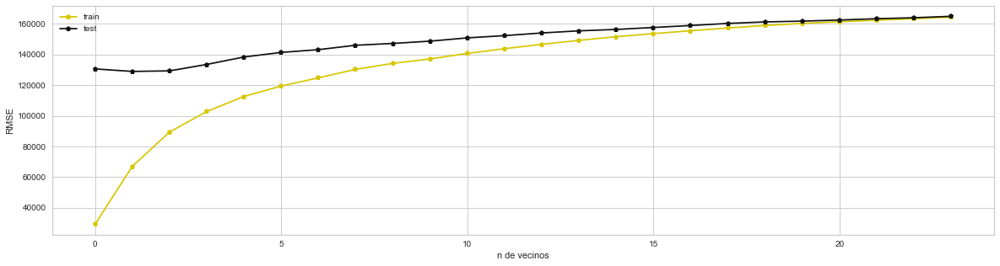

In [189]:
lista_rmse_train = []
lista_rmse_test = []
for i in range (1,25):
    knn = KNeighborsRegressor(n_neighbors=i)
    knn.fit(X_train,y_train)
    # Predecir y evaluar sobre el set de entrenamiento
    y_train_pred = knn.predict(X_train)
    rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
    # Predecir y evaluar sobre el set de evaluación
    y_test_pred = knn.predict(X_test)
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
    # Agregar la información a las listas
    lista_rmse_train.append(rmse_train)
    lista_rmse_test.append(rmse_test)
plt.plot(lista_rmse_train,'p-',label='train',color='y')
plt.plot(lista_rmse_test,'p-',label='test',color='k')
plt.legend()
plt.xlabel('n de vecinos')
plt.ylabel('RMSE')

**Modifico los parámetros del modelo para eliminar overfitting**

In [190]:
knn2=KNeighborsRegressor(n_neighbors=15,weights='uniform',metric='minkowski')
knn2.fit(X_train, y_train)
y_train_pred = knn2.predict(X_train)
y_test_pred = knn2.predict(X_test)
rmse_trainknn2 = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_testknn2 = np.sqrt(mean_squared_error(y_test, y_test_pred))
print(f'Raíz del error cuadrático medio en Train: {"{0:.2f}".format(rmse_trainknn2)}')
print(f'Raíz del error cuadrático medio en Test: {"{0:.2f}".format(rmse_testknn2)}')
print(f'R² del modelo Benchmark: {"{0:.5f}".format(knn2.score(X,y))}')
print(f'R² score de train del modelo Benchmark: {"{0:.5f}".format(r2_score(y_train,y_train_pred))}')
print(f'R² score de test del modelo Benchmark: {"{0:.5f}".format(r2_score(y_test,y_test_pred))}')
scoreknn2=knn2.score(X,y)

Raíz del error cuadrático medio en Train: 151585.72
Raíz del error cuadrático medio en Test: 156301.39
R² del modelo Benchmark: 0.71461
R² score de train del modelo Benchmark: 0.72599
R² score de test del modelo Benchmark: 0.68595


**Resumen de RMSE y R² de Regresión Lineal, Árbol de decisión y Knn para predecir el precio en función de la superficie total y la ubicación del inmueble, detallada a través de Latitud, Longitud**


RMSE Train del modelo Knn: 200169.28413945556

RMSE Train del modelo Lineal: 151389.57004852095

RMSE Train del modelo Arbol: 151585.72297726726

RMSE Test del modelo Knn con n=15: 189792.06969375894

RMSE Test del modelo Lineal: 144324.13452799548

RMSE Test del modelo Arbol con k=5: 156301.3904241215


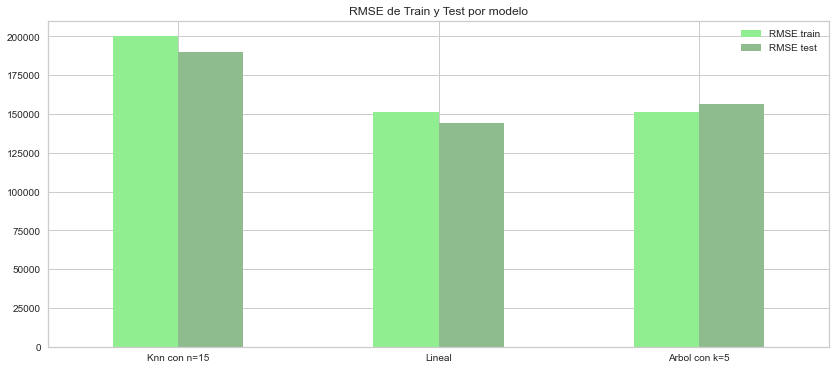

In [191]:
rmsetrain=[rmse_train2rand,rmse_traintree2,rmse_trainknn2]
modelos=['Knn','Lineal','Arbol']
j=0
for i in rmsetrain:
        print(f'\nRMSE Train del modelo {modelos[j]}: {i}')
        j=j+1
rmsetest=[rmse_test2rand,rmse_testtree2,rmse_testknn2]
modelos=['Knn con n=15','Lineal','Arbol con k=5']
j=0
for i in rmsetest:
        print(f'\nRMSE Test del modelo {modelos[j]}: {i}')
        j=j+1    
rmse=pd.DataFrame(columns=['Knn con n=15', 'Lineal', 'Arbol con k=5'],index=['RMSE train', 'RMSE test'])
rmse.loc['RMSE train']=rmsetrain
rmse.loc['RMSE test']=rmsetest
rmse=rmse.T
rmsegraf=rmse.plot(kind='bar',figsize=(14,6), 
        title='RMSE de Train y Test por modelo',rot=0,color=['lightgreen','darkseagreen'])
#bar=sn.barplot(rmsetrain, rmsetest, palette='Set3')
#bar.set_title('R² de cada modelo utilizando los features elegidos')

Score del modelo Knn con n=15: 0.714605534594808
Score del modelo Lineal: 0.5264065390181931
Score del modelo Árbol con k=5: 0.7282797320236434


Text(0.5, 1.0, 'R² de cada modelo utilizando los features elegidos')

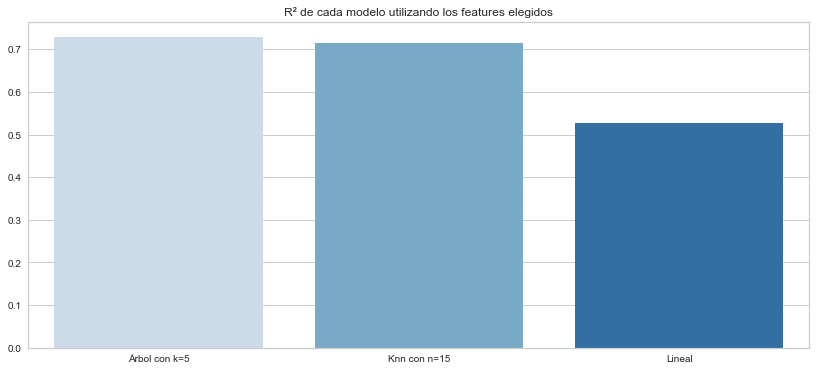

In [192]:
score=[scoreknn2,scorelinear_model2rand,scoretree2]
modelos=['Knn con n=15','Lineal','Árbol con k=5']
j=0
for i in score:
        print(f'Score del modelo {modelos[j]}: {i}')
        j=j+1
plt.figure(figsize=(14,6))
bar=sn.barplot(modelos, score,palette='Blues',order=['Árbol con k=5', 'Knn con n=15', 'Lineal'])
bar.set_title('R² de cada modelo utilizando los features elegidos')

**Siguiendo los resultados obtenidos, el modelo del Árbol es el que mejor predice la variable 'y' (precio) utilizando los 3 features elegidos (superficie total, latitud y longitud). Voy a probar de mejorar su rendimiento agregando algún feature que no tuve en cuenta con anterioridad.**

In [193]:
final2=base.loc[:,['rooms','bedrooms','bathrooms','surface_total','surface_covered','price','property_type','lat','lon','l2','l3']]
final2 = final2.dropna()
y=final2.price
x1=final2.surface_total
x2=final2.lat
x3=final2.lon
x4=final2.rooms

**Agrego rooms en vez de bedrooms ya que está mejor correlacionada con el precio en los tres tipos de propiedad (según pairplot)**

In [194]:
X = np.vstack((x1,x2,x3,x4)).T
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(53739, 4) (53739,) (23032, 4) (23032,)


**Elijo la profundidad óptima del árbol**

Text(0, 0.5, 'R² Score')

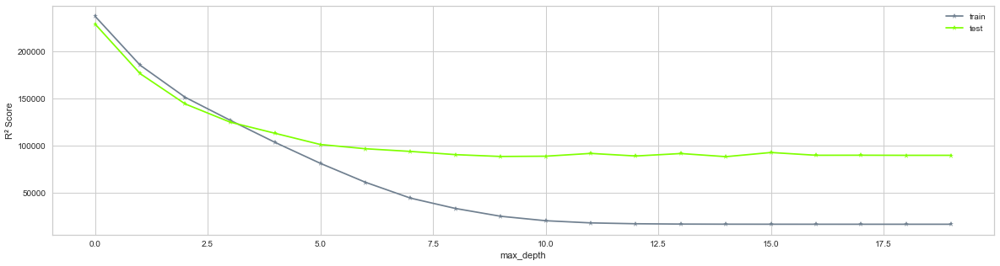

In [195]:
lista_rmse_train = []
lista_rmse_test = []
max_depths = np.linspace(1,40,20)
for i in max_depths:
    tree = DecisionTreeRegressor(max_depth=i, random_state = 42)
    tree.fit(X_train,y_train)
    # Predecir y evaluar sobre el set de entrenamiento
    y_train_pred = tree.predict(X_train)
    rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
    # Predecir y evaluar sobre el set de evaluación
    y_test_pred = tree.predict(X_test)
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
    # Agregar la información a las listas
    lista_rmse_train.append(rmse_train)
    lista_rmse_test.append(rmse_test)
plt.plot(lista_rmse_train,'*-',label='train',color='slategray')
plt.plot(lista_rmse_test,'*-',label='test',color='chartreuse')
plt.legend()
plt.xlabel('max_depth')
plt.ylabel('R² Score')

In [196]:
tree=DecisionTreeRegressor(max_depth=3,max_features=4,random_state=42)
tree.fit(X_train, y_train)
y_train_pred = tree.predict(X_train)
y_test_pred = tree.predict(X_test)
rmse_trainarbol = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_testarbol = np.sqrt(mean_squared_error(y_test, y_test_pred))
print(f'Raíz del error cuadrático medio en Train: {"{0:.2f}".format(rmse_trainarbol)}')
print(f'Raíz del error cuadrático medio en Test: {"{0:.2f}".format(rmse_testarbol)}')
print(f'R² del modelo Benchmark: {"{0:.5f}".format(tree.score(X,y))}')
print(f'R² score de train del modelo Benchmark: {"{0:.5f}".format(r2_score(y_train,y_train_pred))}')
print(f'R² score de test del modelo Benchmark: {"{0:.5f}".format(r2_score(y_test,y_test_pred))}')
scorearbol=tree.score(X,y)

Raíz del error cuadrático medio en Train: 185542.36
Raíz del error cuadrático medio en Test: 176553.37
R² del modelo Benchmark: 0.59228
R² score de train del modelo Benchmark: 0.58948
R² score de test del modelo Benchmark: 0.59930


**La calidad del modelo (medida a través de R²) baja significativamente, por lo que el modelo óptimo para predecir el precio de los tres tipos de propiedades sería:
    Árbol de decisión con max_depth=5,max_features=3,random_state=42 utilizando las siguientes features:
        Superficie total, Latitud y Longitud**

**Testeo si el modelo elegido como el mejor aumenta su Score prediciendo únicamente un tipo de propiedad**

In [197]:
final3=base.loc[:,['rooms','bedrooms','bathrooms','surface_total','surface_covered','price','property_type','lat','lon','l2','l3']]
final3 = final3.dropna()
final3=final3[final3['property_type']=='Departamento']
y=final3.price
x1=final3.surface_total
x2=final3.lat
x3=final3.lon

In [198]:
X = np.vstack((x1,x2,x3)).T
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(45730, 3) (45730,) (19599, 3) (19599,)


In [199]:
tree=DecisionTreeRegressor(max_depth=5,max_features=3,random_state=42)
tree.fit(X_train, y_train)
y_train_pred = tree.predict(X_train)
y_test_pred = tree.predict(X_test)
rmse_trainarbol2 = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_testarbol2 = np.sqrt(mean_squared_error(y_test, y_test_pred))
print(f'Raíz del error cuadrático medio en Train: {"{0:.2f}".format(rmse_trainarbol)}')
print(f'Raíz del error cuadrático medio en Test: {"{0:.2f}".format(rmse_testarbol)}')
print(f'R² del modelo Benchmark: {"{0:.5f}".format(tree.score(X,y))}')
print(f'R² score de train del modelo Benchmark: {"{0:.5f}".format(r2_score(y_train,y_train_pred))}')
print(f'R² score de test del modelo Benchmark: {"{0:.5f}".format(r2_score(y_test,y_test_pred))}')
depto=tree.score(X,y)

Raíz del error cuadrático medio en Train: 185542.36
Raíz del error cuadrático medio en Test: 176553.37
R² del modelo Benchmark: 0.79889
R² score de train del modelo Benchmark: 0.79880
R² score de test del modelo Benchmark: 0.79911


**Para predecir sólo el precio de departamentos, el modelo aumenta su R²**

In [200]:
final4=base.loc[:,['rooms','bedrooms','bathrooms','surface_total','surface_covered','price','property_type','lat','lon','l2','l3']]
final4 = final4.dropna()
final4=final4[final4['property_type']=='Casa']
y=final4.price
x1=final4.surface_total
x2=final4.lat
x3=final4.lon

In [201]:
X = np.vstack((x1,x2,x3)).T
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(1475, 3) (1475,) (633, 3) (633,)


In [202]:
tree=DecisionTreeRegressor(max_depth=5,max_features=3,random_state=42)
tree.fit(X_train, y_train)
y_train_pred = tree.predict(X_train)
y_test_pred = tree.predict(X_test)
rmse_trainarbol3 = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_testarbol3 = np.sqrt(mean_squared_error(y_test, y_test_pred))
print(f'Raíz del error cuadrático medio en Train: {"{0:.2f}".format(rmse_trainarbol)}')
print(f'Raíz del error cuadrático medio en Test: {"{0:.2f}".format(rmse_testarbol)}')
print(f'R² del modelo Benchmark: {"{0:.5f}".format(tree.score(X,y))}')
print(f'R² score de train del modelo Benchmark: {"{0:.5f}".format(r2_score(y_train,y_train_pred))}')
print(f'R² score de test del modelo Benchmark: {"{0:.5f}".format(r2_score(y_test,y_test_pred))}')
casa=tree.score(X,y)

Raíz del error cuadrático medio en Train: 185542.36
Raíz del error cuadrático medio en Test: 176553.37
R² del modelo Benchmark: 0.66992
R² score de train del modelo Benchmark: 0.70308
R² score de test del modelo Benchmark: 0.54228


**Para predecir sólo el precio de Casas, el modelo disminuye su R²**

In [203]:
final4=base.loc[:,['rooms','bedrooms','bathrooms','surface_total','surface_covered','price','property_type','lat','lon','l2','l3']]
final4 = final4.dropna()
final4=final4[final4['property_type']=='PH']
y=final4.price
x1=final4.surface_total
x2=final4.lat
x3=final4.lon

In [204]:
X = np.vstack((x1,x2,x3)).T
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(6533, 3) (6533,) (2801, 3) (2801,)


In [205]:
tree=DecisionTreeRegressor(max_depth=5,max_features=3,random_state=42)
tree.fit(X_train, y_train)
y_train_pred = tree.predict(X_train)
y_test_pred = tree.predict(X_test)
rmse_trainarbol4 = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_testarbol4 = np.sqrt(mean_squared_error(y_test, y_test_pred))
print(f'Raíz del error cuadrático medio en Train: {"{0:.2f}".format(rmse_trainarbol)}')
print(f'Raíz del error cuadrático medio en Test: {"{0:.2f}".format(rmse_testarbol)}')
print(f'R² del modelo Benchmark: {"{0:.5f}".format(tree.score(X,y))}')
print(f'R² score de train del modelo Benchmark: {"{0:.5f}".format(r2_score(y_train,y_train_pred))}')
print(f'R² score de test del modelo Benchmark: {"{0:.5f}".format(r2_score(y_test,y_test_pred))}')
ph=tree.score(X,y)

Raíz del error cuadrático medio en Train: 185542.36
Raíz del error cuadrático medio en Test: 176553.37
R² del modelo Benchmark: 0.74224
R² score de train del modelo Benchmark: 0.75178
R² score de test del modelo Benchmark: 0.71731


**Para predecir sólo el precio de PHs, el modelo aumenta su R²**

Text(0.5, 1.0, 'R² del modelo elegido para cada tipo de propiedad')

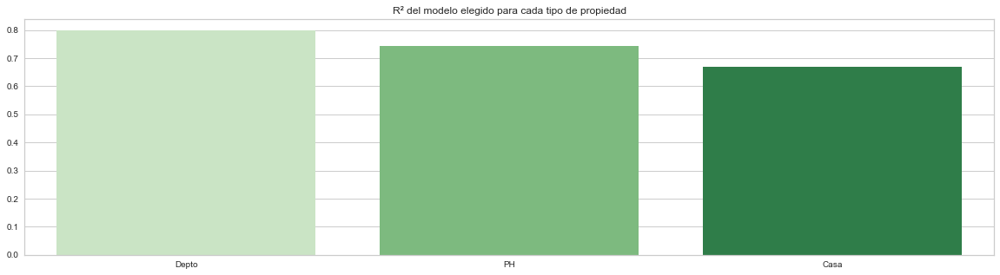

In [206]:
scores=[casa,depto,ph]
nombres=['Casa','Depto','PH']
bar=sn.barplot(nombres, scores,palette='Greens',order=['Depto','PH','Casa'])
bar.set_title('R² del modelo elegido para cada tipo de propiedad')

In [207]:
print('Cuestiones a tener en cuenta para mejorar el modelo:\n*Los filtros efectuados pueden haber limitado considerablemente el análisis, principalmente superficie total y cubierta.\n*Si bien latitud y longitud daban indicio de la ubicación, en CABA existen barrios que están a metros uno del otro y su precio fluctúa considerablemente y no se puede detectar con lat y lon (Retiro-Puerto Madero/Once-Recoleta).\n*El modelo estima mejor el precio de los Departamentos y PH que los de Casas, lo que podría deberse a la disponibilidad de registros en la base o podría llegar a significar que los filtros para superficie limitaron el análisis, delimitando la capacidad de predicción a tipos de propiedades que suelen tener mayor cantidad de m²')

Cuestiones a tener en cuenta para mejorar el modelo:
*Los filtros efectuados pueden haber limitado considerablemente el análisis, principalmente superficie total y cubierta.
*Si bien latitud y longitud daban indicio de la ubicación, en CABA existen barrios que están a metros uno del otro y su precio fluctúa considerablemente y no se puede detectar con lat y lon (Retiro-Puerto Madero/Once-Recoleta).
*El modelo estima mejor el precio de los Departamentos y PH que los de Casas, lo que podría deberse a la disponibilidad de registros en la base o podría llegar a significar que los filtros para superficie limitaron el análisis, delimitando la capacidad de predicción a tipos de propiedades que suelen tener mayor cantidad de m²


## Proyecto 2: Ingeniería de features, Modelos avanzados e Interpretación de modelos

#### Se utilizará nuevamente la base de datos de Properati, compuesta por propiedades a la venta con distintas características ubicadas en Capital Federal y Gran Buenos Aires, Argentina.

In [208]:
import pandas as pd
import numpy as np
import seaborn as sn
import matplotlib.pyplot as plt

In [209]:
prop=pd.read_csv('Properati.csv')
prop.head(2)

,start_date,end_date,created_on,lat,lon,l1,l2,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,currency,title,description,property_type,operation_type
0,2019-10-17,2019-12-23,2019-10-17,-34.605880,-58.384949,Argentina,Capital Federal,San Cristobal,7.0,7.0,2.0,140.0,140.0,153000.0,USD,"***Venta semipiso centro, ideal hostel*****",DESCRIPCION DE LA PROPIEDAD: Departamento de 1...,Departamento,Venta
1,2019-10-17,2019-11-21,2019-10-17,-34.624056,-58.412110,Argentina,Capital Federal,Boedo,2.0,1.0,2.0,70.0,58.0,159000.0,USD,Espectacular PH reciclado en Boedo sin expensas.,PH reciclado en Boedo a una cuadra de la plaz...,PH,Venta


- Análisis de los datos a partir de PandasProfiling

In [210]:
from pandas_profiling import ProfileReport
reporte=ProfileReport(prop,title='Análisis del dataset Properati')
reporte.to_file('Análisis del dataset Properati.html')

### Consideraciones:
   - Las variables start_date, end_date, created_on y currency son irrelevantes para el análisis. Las primeras tres corresponden a la fecha de creación de la publicación en Properati, y la tercera toma el mismo valor en todas las instancias del dataset.
   - La variable L1 indica el país donde está ubicada la propiedad. En este caso, en todas las instancias es "Argentina", por lo que es no es necesaria tenerla en cuenta para el análisis. Lo mismo ocurre con operation_type, en todos los casos es "venta".
   - La variable title y description son propias de la publicación de donde surge la base. No necesarias para el análisis.
### Se remueven las ocho variables por no ser relevantes para el proyecto.

In [211]:
prop=prop.drop(['start_date','end_date','created_on','l1','title','description','operation_type','currency'],axis=1)
prop.head(2)
print(f'Longitud del dataset original: {len(prop)} instancias')

Longitud del dataset original: 146660 instancias


## Parte A: Transformación de datos

### 1. Valores faltantes

In [212]:
print(f'Valores faltantes por cada variable\n{prop.isnull().sum()}')

Valores faltantes por cada variable
lat                 9925
lon                 9959
l2                     0
l3                     0
rooms                  0
bedrooms               0
bathrooms           5957
surface_total      20527
surface_covered    21614
price                  0
property_type          0
dtype: int64


In [213]:
!pip install missingno

- A través de la libreria *missingno* resulta más fácil poder detectar algún caso de faltantes relacionadas con otras variables.

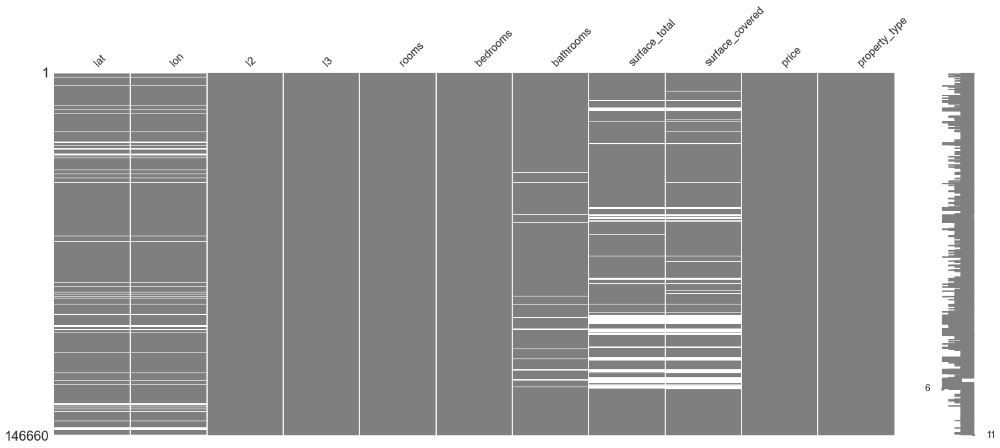

In [214]:
import missingno as msno 
msno.matrix(prop,color=(0.5,0.5,0.5))

In [215]:
prop.corr()

,lat,lon,rooms,bedrooms,bathrooms,surface_total,surface_covered,price
lat,1.000000,-0.975578,-0.010933,0.007618,0.019923,-0.019598,-0.004156,0.013393
lon,-0.975578,1.000000,-0.006931,-0.016905,-0.028612,-0.049097,-0.014388,0.009368
rooms,-0.010933,-0.006931,1.000000,0.869769,0.613308,0.081044,0.075012,0.351025
bedrooms,0.007618,-0.016905,0.869769,1.000000,0.588527,0.079229,0.072627,0.316192
bathrooms,0.019923,-0.028612,0.613308,0.588527,1.000000,0.061159,0.069361,0.556861
surface_total,-0.019598,-0.049097,0.081044,0.079229,0.061159,1.000000,0.430887,0.038727
surface_covered,-0.004156,-0.014388,0.075012,0.072627,0.069361,0.430887,1.000000,0.049136
price,0.013393,0.009368,0.351025,0.316192,0.556861,0.038727,0.049136,1.000000


* No existen casos de valores faltantes MCAR *(Missing Completely at Random)* ya que la probabilidad de tener un dato faltante no es la misma en todas las instancias.

- Considero que existen casos de **MAR *(Missing At Random)* para la variable surface_covered**, ya que puede existir la posibilidad que no haya dato debido a que ya fue registrada la superficie total (surface_total) y se considera irrelevante para el encuestado si surface_total=surface_covered.

* Las variables que indican la ubicación exacta de la propiedad **(lat y lon) pueden ser casos de MNAR *(Missing Not At Random)*** ya que sus faltantes pueden ser producto de una decisión de no responder la ubicación exacta de la propiedad por prejuicio del propietario.

- Para el caso de surface_total y surface_covered, ambas presentan una relación significativa (en términos relativos) con la otra, en donde las dos tienen valores faltantes. 

Se intentará detectar errores MAR (*Missing at random*) para el caso de los valores faltantes en **bathrooms** utilizando la columna de rooms (variable sin datos faltantes y con posible relación con bathrooms).

In [216]:
bath=prop.bathrooms.isnull().groupby([prop.rooms]).sum().astype(int).reset_index(name='Faltantes de Bathrooms')
print(bath)

    rooms  Faltantes de Bathrooms
0     1.0                    2270
1     2.0                    1095
2     3.0                    1262
3     4.0                     723
4     5.0                     350
5     6.0                     119
6     7.0                      97
7     8.0                      10
8     9.0                       9
9    10.0                      18
10   11.0                       0
11   12.0                       1
12   13.0                       1
13   14.0                       0
14   15.0                       0
15   16.0                       1
16   18.0                       0
17   20.0                       0
18   21.0                       0
19   24.0                       0
20   25.0                       1
21   26.0                       0
22   30.0                       0
23   32.0                       0
24   35.0                       0


* No considero tener la información suficiente para clasificar de variable con faltantes *MAR* a la variable *bathrooms*, ya que no parece tener una distribución uniforme de los faltantes con respecto a la única variable con la que presenta una correlación relativamente significativa (*rooms*).

Detección de errores MNAR (*Missing Not At Random*) en surface_total y surface_covered

In [217]:
prop['total-intervalos'] = pd.cut(prop.surface_total, bins  = 10)
prop['covered-intervalos'] = pd.cut(prop.surface_covered, bins  = 10)

In [218]:
falt1 = prop.surface_covered.isnull().groupby([prop['total-intervalos']]).sum().astype(int).reset_index(name='count')
falt1['freq'] = falt1['count']/prop.groupby([prop['total-intervalos']]).count()['surface_total'].values
falt1["valor del centro del intervalo"] = falt1["total-intervalos"].apply(lambda x: x.mid)
falt2 = prop.surface_total.isnull().groupby([prop['covered-intervalos']]).sum().astype(int).reset_index(name='count')
falt2['freq'] = falt2['count']/prop.groupby([prop['covered-intervalos']]).count()['surface_covered'].values
falt2["valor del centro del intervalo"] = falt2["covered-intervalos"].apply(lambda x: x.mid)

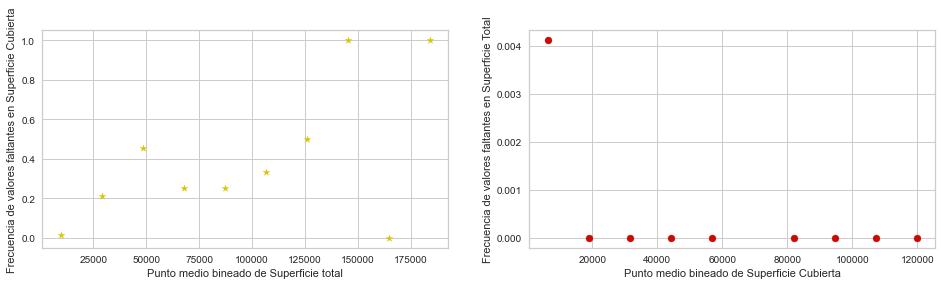

In [219]:
plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
plt.scatter(falt1['valor del centro del intervalo'], falt1['freq'],c='y',marker='*')
plt.xlabel('Punto medio bineado de Superficie total')
plt.ylabel('Frecuencia de valores faltantes en Superficie Cubierta')
plt.subplot(1,2,2)
plt.scatter(falt2['valor del centro del intervalo'], falt2['freq'],c='r', marker='o')
plt.xlabel('Punto medio bineado de Superficie Cubierta')
plt.ylabel('Frecuencia de valores faltantes en Superficie Total')
plt.show()

* Existe una posible relación entre los valores faltantes de surface_covered y el punto medio bineado de surface_total, por lo que da indicios a la conclusión obtenida con anterioridad. La conclusión surge al mirar el primer gráfico y ver una tendencia ascendente hasta 125.000 m2 en el punto medio bineado de surface_total, donde a partir de allí se pueden considerar outliers por el alto valor de la variable.

- Para los casos de valores faltantes en surface_covered en los que existe dato para surface_total, le inputo el valor a surface_covered para reducir la cantidad de valores faltantes

In [220]:
prop['surface_covered']=prop['surface_covered'].fillna(prop['surface_total'])

- Observo el caso de lat y lon a ver si puede estar correlacionado con una cuestión de ubicación de la vivienda el motivo por el cual no responden 

- Elimino el resto de valores faltantes en el dataset

In [221]:
prop=prop.drop(['covered-intervalos','total-intervalos'],axis=1)
prop=prop.dropna()
print(f'El nuevo dataset sin valores faltantes contiene: {len(prop)} instancias')

El nuevo dataset sin valores faltantes contiene: 115698 instancias


- Antes de continuar, **elimino inconsistencias** que pueden existir si la superficie cubierta es mayor a la total (surface_covered>surface_total) y si la cantidad de habitaciones es mayor a la cantidad de ambientes (bedrooms>rooms).

- Además, como voy a trabajar únicamente en la predicción de espacios aptos para vivienda (Casa, Casa de Campo, PH y Departamento), establezco un mínimo posible para los valores de surface_total y surface_covered. **Estas no pueden ser menor a 25 m2.**

In [222]:
prop.property_type.value_counts()

Departamento       85602
Casa               15238
PH                 13606
Lote                 433
Oficina              352
Casa de campo        240
Otro                 202
Local comercial       17
Depósito               6
Cochera                2
Name: property_type, dtype: int64

In [223]:
prop=prop[(prop['surface_total']>=prop['surface_covered'])&(prop['rooms']>=prop['bedrooms'])]
prop=prop[(prop['surface_total']>=25)&(prop['surface_covered']>=25)]
print(f'El nuevo dataset sin inconsistencias contiene: {len(prop)} instancias')

El nuevo dataset sin inconsistencias contiene: 113327 instancias


### 2. Detección y eliminación de outliers

- Como primer paso, se crea una función que permita detectar de manera ágil los outliers en cada variable numérica de la base, excluyendo las categóricas.

In [224]:
def detec(base):
    '''
    La función muestra un boxplot para cada una de la variables numéricas de la base indicada para detectar si es necesario aplicar
    el método de las 3 sigmas para tratar outliers. 
    Llamarla de la siguiente forma:
        detec(base)
    '''
    columns = base.columns
    numericas=[]
    columnas = []
    from pandas.api.types import is_numeric_dtype
    for x in range (0, len(base.columns)):
        if is_numeric_dtype(base[str(base.columns[x])]) == False:
            columnas.append(base.columns[x])
        else:
            numericas.append(base.columns[x])
    
    print(f'Se descartan las siguientes columnas porque son categoricas: {columnas}')
    
    for x in numericas:
        plt.figure(figsize=(14,6))
        sn.boxplot(base[x],color='greenyellow')
        plt.title(f'Detección de outliers en {x}')
    

Se descartan las siguientes columnas porque son categoricas: ['l2', 'l3', 'property_type']


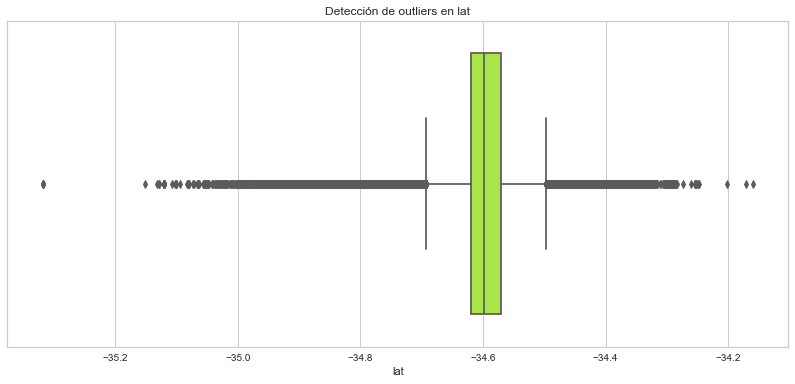

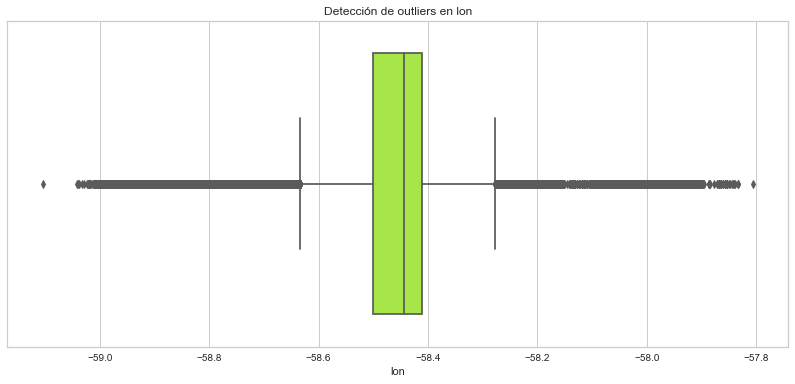

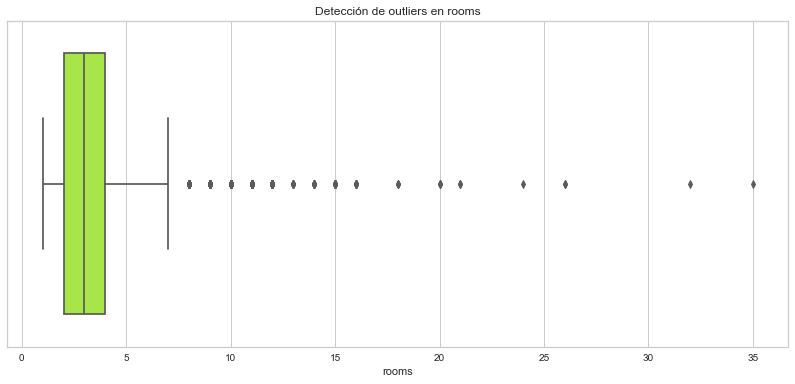

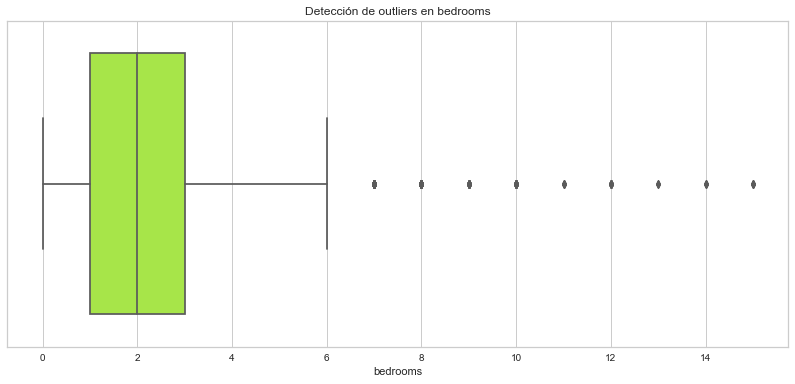

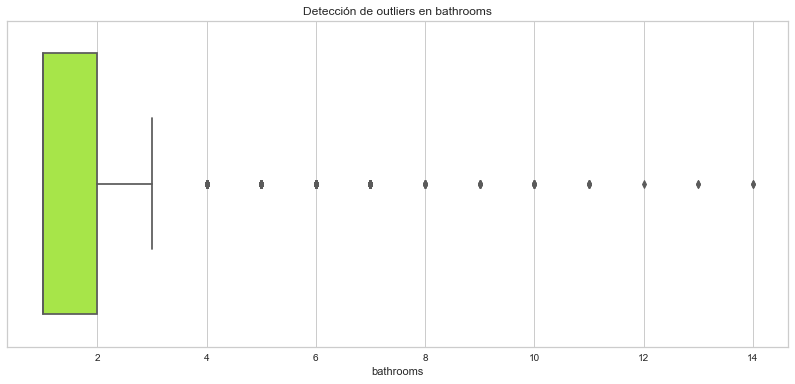

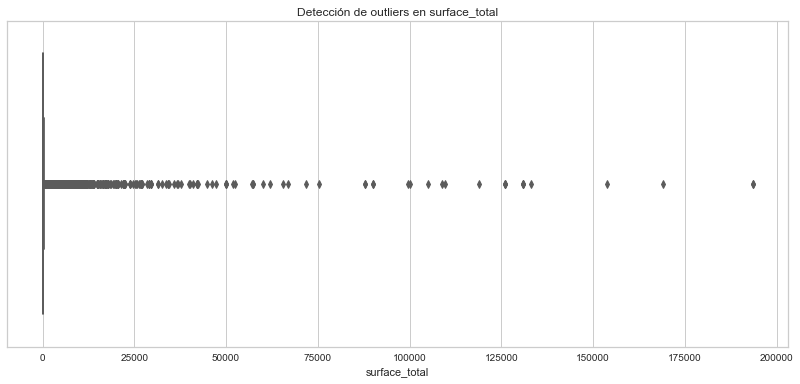

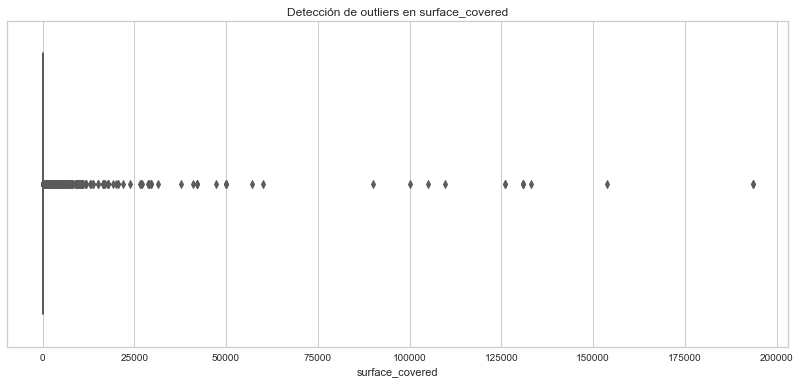

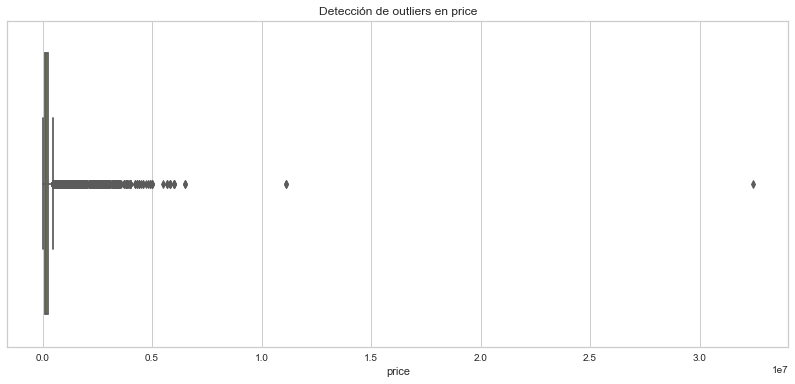

In [225]:
detec(prop)

- A partir de la función, se descartan las variables categóricas y se observan los outliers de las variables numéricas del dataset. Existen outliers significativos en **price, surface_total, surface_covered, rooms, bedrooms y bathrooms.**

#### Se tratarán los outliers a través del **Método 3 Sigmas** por haber visto en clase que elimina menor cantidad de outliers que el Rango Intercuartílico.

In [226]:
import statistics as stats
def sigma(base, var):
    '''
    Se aplica el método de las 3 sigmas, devolviendo un distplot de las variables seleccionadas con el método aplicado.
    La función se llama de la siguiente forma:
        -sigma(base, ['variables'])
    '''
    for i in var:
        variable=base[i]
        media=variable.mean()
        minValue=media-3*variable.std()
        maxValue=media+3*variable.std()
        base = base[(variable >= minValue) & (variable <= maxValue)] 
        plt.figure(figsize=(14,6))
        plt.title(f'Eliminación de outliers a través del método sigma de la variable {i}')
        plot=sn.distplot(base[i],color='y',bins=100)

    
    return base, plot

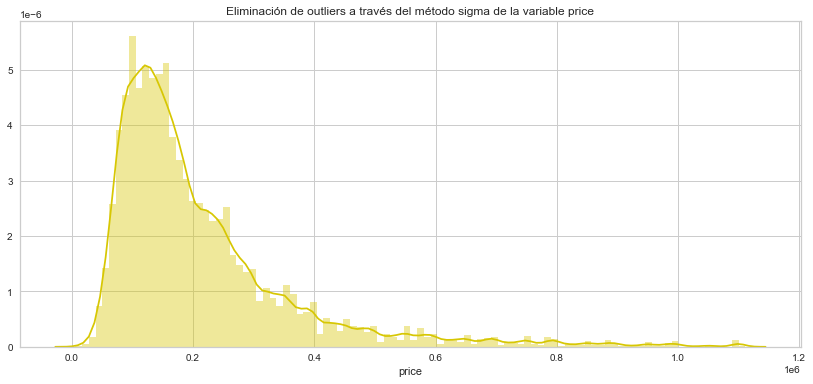

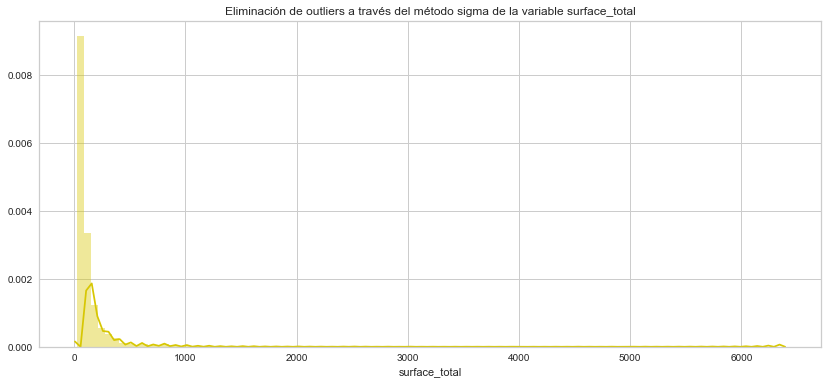

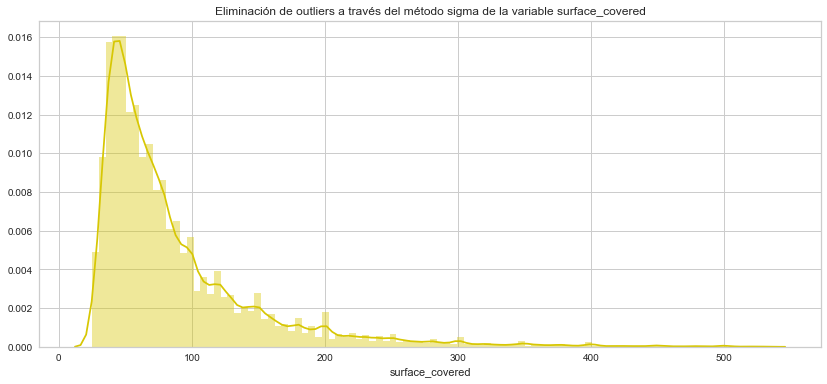

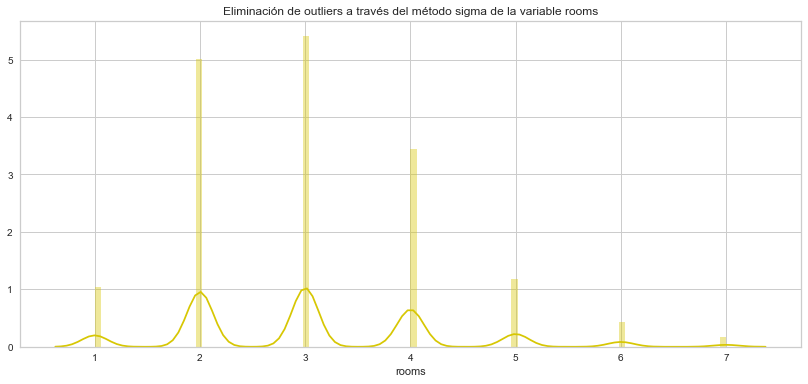

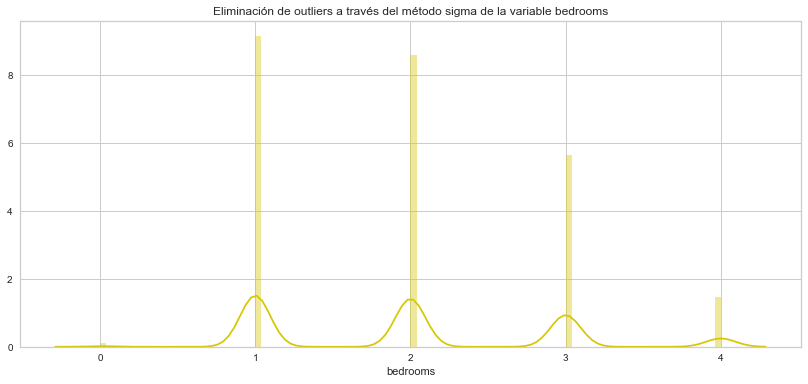

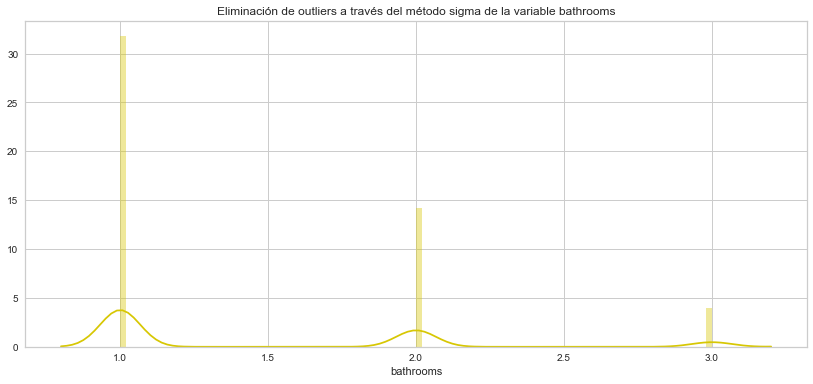

In [227]:
prop, _ = sigma(prop, ['price','surface_total','surface_covered','rooms','bedrooms','bathrooms'])

- Descripción de las variables a ver si tiene sentido la aplicación de 3 sigmas

In [228]:
prop.describe()

,lat,lon,rooms,bedrooms,bathrooms,surface_total,surface_covered,price
count,106304.000000,106304.000000,106304.000000,106304.000000,106304.000000,106304.000000,106304.000000,1.063040e+05
mean,-34.598047,-58.462679,2.967715,1.938638,1.444123,127.223341,81.112047,2.022692e+05
std,0.094379,0.138353,1.124337,0.901876,0.637263,236.470577,53.906425,1.402977e+05
min,-35.150806,-59.042416,1.000000,0.000000,1.000000,25.000000,25.000000,6.000000e+03
25%,-34.620123,-58.499123,2.000000,1.000000,1.000000,51.000000,46.000000,1.120000e+05
50%,-34.598219,-58.443241,3.000000,2.000000,1.000000,74.000000,65.000000,1.600000e+05
75%,-34.572173,-58.411980,4.000000,3.000000,2.000000,120.000000,97.000000,2.459660e+05
max,-34.202767,-57.805832,7.000000,4.000000,3.000000,6375.000000,532.000000,1.111111e+06


- Las variables surface_total, surface_covered y price parecen no tener una distribución uniforme de sus datos, aunque a partir del método de 3 sigmas se redujo significativamente la cantidad de registros.

In [229]:
print(f'Nuevo tamaño del dataset sin outliers: {len(prop)}')
prop=prop.reset_index(drop=True)

Nuevo tamaño del dataset sin outliers: 106304


##### DBSCAN ###

- Se utilizará DBSCAN para observar si todavia existen datos "ruido", es decir, que tomen valor -1, y considerarlos outliers de la muestra.

- Se aplicará a las variables surface_covered, surface_total y price, que son las que mayor cantidad de outliers presentaron. 

- Además, se tomará una muestra del 20% de la base para hacer DBSCAN por el costo computacional que significa hacer DBSCAN teniendo en cuenta todo el dataset

In [230]:
muestra=prop.sample(frac=0.2)

- Elijo un eps de 5 para los casos de surface_covered y surface_total. Es decir, que tenga en cuenta 5 m2 para formar los clusteres. Para el caso de los precios pongo un eps de 20 para no ser muy exigente.

In [231]:
from sklearn.cluster import DBSCAN
X1=muestra[['surface_covered']]
dbscan1 = DBSCAN(eps=5,min_samples=10,n_jobs=10)
dbscan1.fit(X1)
X2=muestra[['surface_total']]
dbscan2 = DBSCAN(eps=5,min_samples=10,n_jobs=10)
dbscan2.fit(X2)
X3=muestra[['price']]
dbscan3 = DBSCAN(eps=20,min_samples=10,n_jobs=10)
dbscan3.fit(X3)

DBSCAN(algorithm='auto', eps=20, leaf_size=30, metric='euclidean',
       metric_params=None, min_samples=10, n_jobs=10, p=None)

In [232]:
etiquetas1 = dbscan1.labels_
etiquetas2 = dbscan2.labels_
etiquetas3 = dbscan3.labels_

In [233]:
n_clusters1 = len(set(etiquetas1)) - (1 if -1 in etiquetas1 else 0)
n_noise1 = list(etiquetas1).count(-1)
n_clusters2 = len(set(etiquetas2)) - (1 if -1 in etiquetas2 else 0)
n_noise2 = list(etiquetas2).count(-1)
n_clusters3 = len(set(etiquetas3)) - (1 if -1 in etiquetas3 else 0)
n_noise3 = list(etiquetas3).count(-1)

In [234]:
print(f'Número de clusters estimado para {X1.iloc[:,0].name}: %d' % n_clusters1)
print(f'Número estimado de puntos "ruido" para {X1.iloc[:,0].name}: {n_noise1}\n')

print(f'Número de clusters estimado para {X2.iloc[:,0].name}: %d' % n_clusters2)
print(f'Número estimado de puntos "ruido" para {X2.iloc[:,0].name}: {n_noise2}\n')

print(f'Número de clusters estimado para {X3.iloc[:,0].name}: %d' % n_clusters3)
print(f'Número estimado de puntos "ruido" para {X3.iloc[:,0].name}: %d' % n_noise3)

Número de clusters estimado para surface_covered: 3
Número estimado de puntos "ruido" para surface_covered: 42

Número de clusters estimado para surface_total: 17
Número estimado de puntos "ruido" para surface_total: 267

Número de clusters estimado para price: 297
Número estimado de puntos "ruido" para price: 2904


In [235]:
def plot_DBSCAN(X,etiquetas,dbscan,n_clusters):
    # Armamos una mascara, con unos en los datos que son CORES.
    core_samples_mask_1 = np.zeros_like(dbscan.labels_, dtype=bool)
    core_samples_mask_1[dbscan.core_sample_indices_] = True
    # Plot result

    # Black removed and is used for noise instead.
    unique_labels = set(etiquetas)
    colors = [plt.cm.Spectral(each)
              for each in np.linspace(0, 1, len(unique_labels))]
    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Black used for noise.
            col = [0, 0, 0, 1]

        class_member_mask = (etiquetas == k)

        xy = X[class_member_mask & core_samples_mask_1]
    
        plt.plot(xy.iloc[:, 0],'o', markerfacecolor=tuple(col),
                 markeredgecolor='k', markersize=14)
        xy = X.iloc[class_member_mask & ~core_samples_mask_1]
        plt.plot(xy.iloc[:, 0], 'o', markerfacecolor=tuple(col),
                 markeredgecolor='k', markersize=3)
    i=X.iloc[:,0].name
    plt.title(f'Número estimado de clusters para {i}: %d' % n_clusters)
    plt.show()
    return 

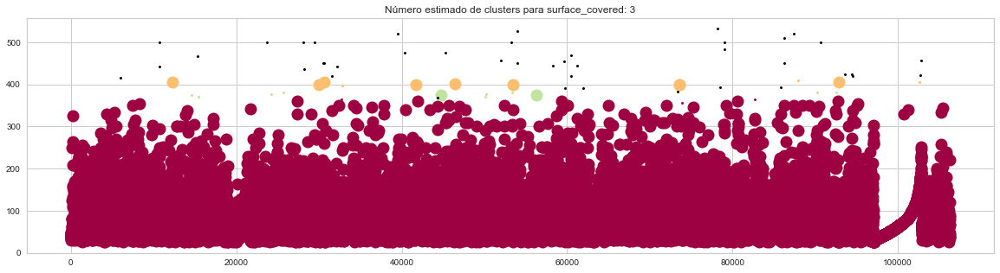

In [236]:
plot_DBSCAN(X1,etiquetas1,dbscan1,n_clusters1)

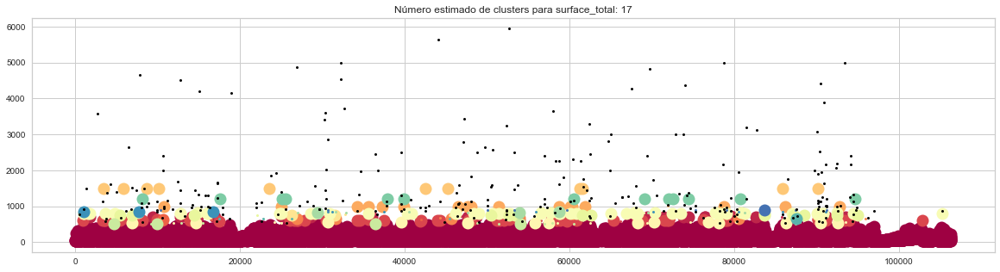

In [237]:
plot_DBSCAN(X2,etiquetas2,dbscan2,n_clusters2)

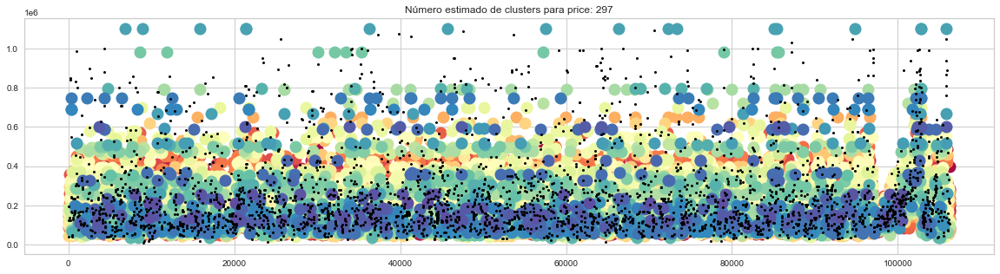

In [238]:
plot_DBSCAN(X3,etiquetas3,dbscan3,n_clusters3)

- El método DBSCAN deja en evidencia que podría seguir habiendo outliers para surface_total y surface_covered, pero no parecen ser significativas al análisis, por lo que decido dejarlos. Capaz se tratan de grandes casas con gran cantidad de m2 y de jardin, lo que hace la diferencia de los valores máximos entre surface_total y surface_covered.

### 3. Escalado de datos

- Se normalizarán los datos a través del escalado por **Z-Score** por tener variables con diferentes unidades de medida (superficie total y cubierta en m2, lat y lon en grados, rooms, bedrooms y bathrooms en unidades).

In [239]:
variables=prop[['surface_total','surface_covered','lat','lon','rooms','bedrooms','bathrooms']]
prop2 = (variables - variables.mean())/variables.std()
prop = prop.drop(['surface_total','surface_covered','lat','lon','rooms','bedrooms','bathrooms'],axis=1)
prop = pd.concat([prop2, prop], axis=1)
print(prop.shape)

(106304, 11)


### 4. Encoders

- Existen atributos categóricos en el dataset. **Los mismos son: l2, l3 y property_type.**
- Los tres son considerados **atributos categóricos nominales**, ya que no existe una relación de orden entre ellos.
- Se transformarán las variables **l2** y **property_type**, dejando de lado **l3**, que indica los barrios, para no hacer extradamente extenso el dataset.
- En primer lugar, se tranformará en dummy la variable **l2**, tomando valor 0 cuando la propiedad se ubique en Capital Federal, y 1 en Gran  Buenos Aires.
- Luego, se tranformará la variable property_type a partir del método **One-Hot Encoding** 

1. Con la variable l2

In [240]:
prop['l2']=prop['l2'].map({'Capital Federal':0,'Bs.As. G.B.A. Zona Sur':1,'Bs.As. G.B.A. Zona Norte':1,'Bs.As. G.B.A. Zona Oeste':1})

3. Con la variable property_type

In [241]:
from sklearn.preprocessing import OneHotEncoder
proper=np.array(prop.property_type)
proper=proper.reshape(-1, 1)
enc = OneHotEncoder(handle_unknown='ignore')
enc.fit_transform(proper)
onehot = enc.transform(proper).toarray()
onehot=pd.DataFrame(onehot,columns=['Casa', 'Casa de campo', 'Departamento', 'Depósito','Local comercial', 'Lote', 'Oficina', 'Otro', 'PH'])

In [242]:
enc.categories_

[array(['Casa', 'Casa de campo', 'Departamento', 'Depósito',
        'Local comercial', 'Lote', 'Oficina', 'Otro', 'PH'], dtype=object)]

- Luego de transformar en numéricas a las variables categóricas, aumentará la cantidad de columnas a considerar en el análisis.

In [243]:
prop = pd.concat([prop,onehot], axis=1,verify_integrity=True)
prop=prop.drop(['property_type'],axis=1)
print(f'Nuevo tamaño del dataset luego de transformar las variables categóricas en numéricas:\n{len(prop)} filas y {len(prop.columns)} columnas')

Nuevo tamaño del dataset luego de transformar las variables categóricas en numéricas:
106304 filas y 19 columnas


### 5. Reducción de dimensionalidad: *Principal Component Analysis*

- Para reducir la dimensionalidad del dataset utilizaré el método **PCA (*Principal Component Analysis*)** únicamente con las variables que son numéricas desde un principio, no utilizaré las variables dummy que surgen del proceso anterior (Encoders) para obtener un resultado más claro al momento de realizar un modelo de Machine Learning.

- Por lo tanto, las variables a utilizar son: **lat, lon, surface_covered, surface_total, bedrooms, rooms y bathrooms**. Se excluye **price** ya que será la variable predictora y la utilizaré para ver el comportamiento antes y después de reducir dimensionalidad

In [244]:
X=prop[['surface_total','surface_covered','lat','lon','rooms','bedrooms','bathrooms','price']]

- Primero veo el comportamiento de las variables a lo largo de las instancias con el precio asi tengo una idea de su fluctuación para luego compararla con los datos que resultan de PCA.

- La siguiente función sirve unicamente para agilizar la visualización y reducir espacio en el notebook

In [245]:
def grafico(var,color):
    '''
    La función grafica la relación entre las variables del dataset indicado y el precio de la base de
    properati a lo largo del dataset.
    Se escribe de la siguiente manera:
    grafico('variable', 'color')
    '''
    for i in var:
        variable=var[i]
        plt.figure(figsize=(12,6))
        plt.plot(variable,prop['price'],'*',color=color)
        plt.xlabel(f'{variable.name}')
        plt.ylabel('Price')
    

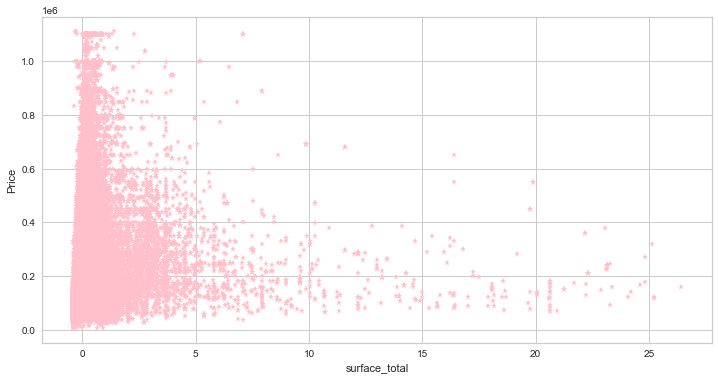

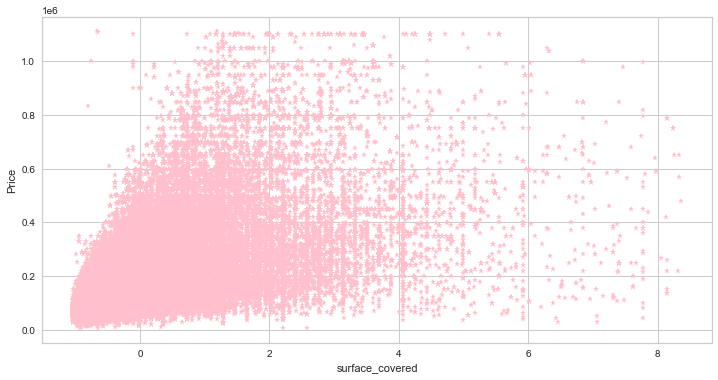

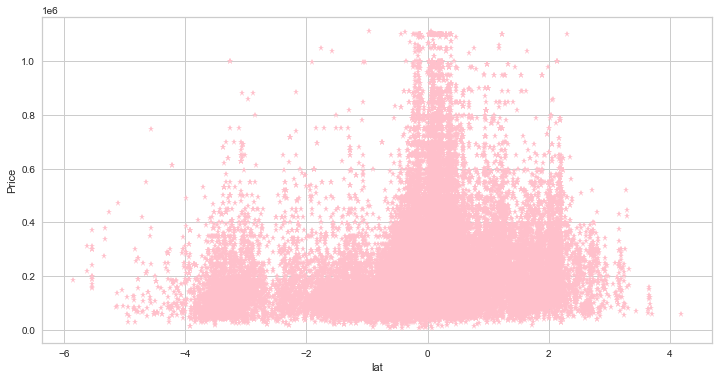

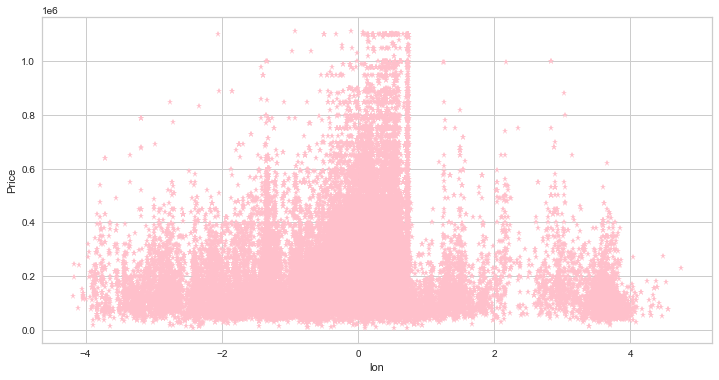

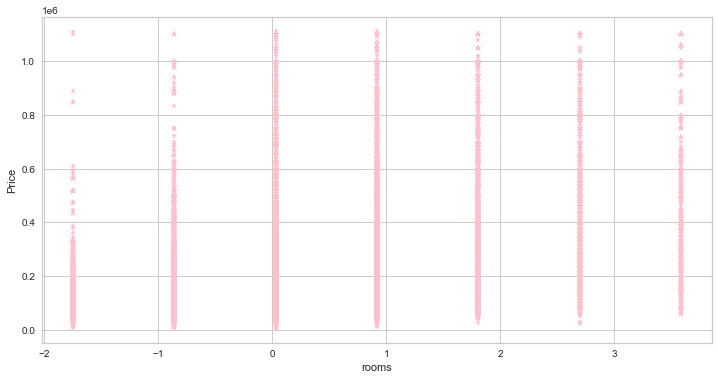

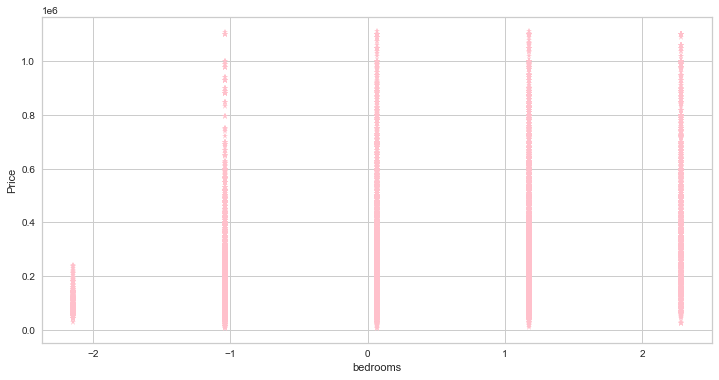

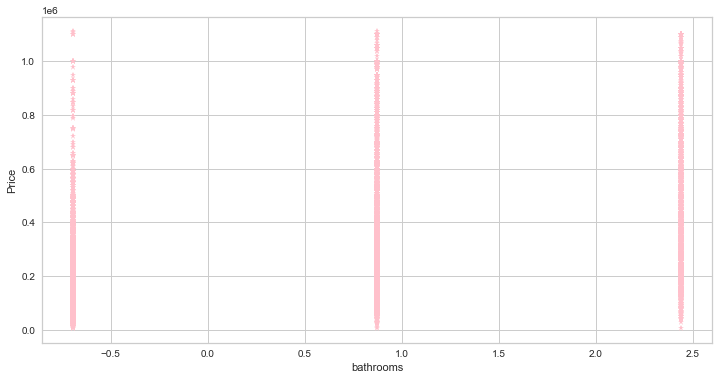

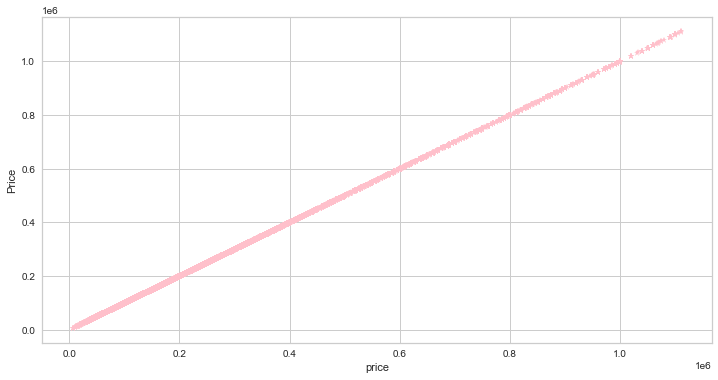

In [246]:
grafico(X,'pink')

In [247]:
from sklearn.decomposition import PCA

pca = PCA()
X_nuevo = pca.fit_transform(X) 

- X_nuevo va a ser mi nuevo dataset con los datos procesados

- Determino para cuántos componentes limitar el análisis de PCA a partir de la proporción de varianza explicada.

In [248]:
expl = pca.explained_variance_ratio_
print(expl)

[1.00000000e+00 1.10153439e-10 8.73518590e-11 4.08652705e-11
 2.40886712e-11 1.49293524e-11 1.05473445e-11 3.79825254e-12]


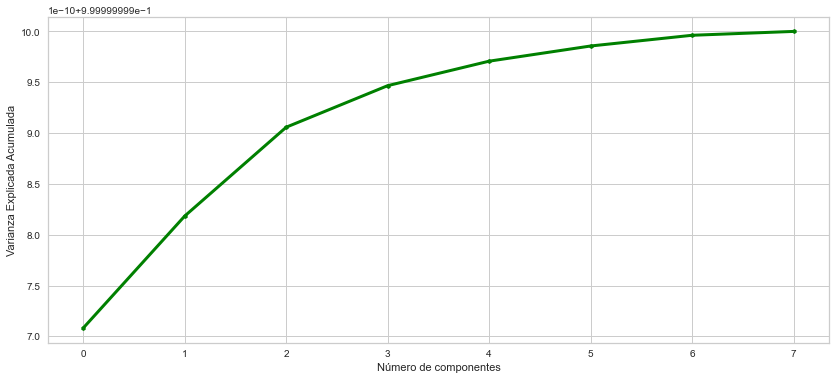

In [249]:
plt.figure(figsize=(14,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_),'h-',markersize=5,linewidth=3,color='green')
plt.xlabel('Número de componentes')
plt.ylabel('Varianza Explicada Acumulada')
plt.show()

- Establezco un umbral de tolerancia del 90-95% de explicación de la varianza, por lo que considero incoporar 4 componentes al análisis PCA

In [250]:
print(f'Los cinco primeros componentes explican el: {sum(expl[0:3])} de la varianza')

Los cinco primeros componentes explican el: 0.999999999905771 de la varianza


In [251]:
pca=PCA(n_components=4)
X_nuevo=pca.fit_transform(X)

In [252]:
X_nuevo=pd.DataFrame(X_nuevo)
X_nuevo.shape

(106304, 4)

In [253]:
X_nuevo.head(2)

,0,1,2,3
0,-43269.243005,-0.711892,-0.323247,0.117165
1,-77269.243012,-1.098819,-0.136855,0.256989


- Observo la participación de cada variable en las nuevas features obtenidas a través de **pca.components_** y vuelvo a graficar cada una de ellas con respecto a price para ver si puedo establecer una relación con el antiguo dataset.

In [254]:
print(X.columns)
np.round(pca.components_,3)

Index(['surface_total', 'surface_covered', 'lat', 'lon', 'rooms', 'bedrooms',
       'bathrooms', 'price'],
      dtype='object')


array([[ 0.   ,  0.   ,  0.   ,  0.   ,  0.   ,  0.   ,  0.   ,  1.   ],
       [ 0.397,  0.443, -0.148, -0.067,  0.525,  0.517,  0.278, -0.   ],
       [ 0.122,  0.026,  0.681, -0.715, -0.039, -0.018,  0.082, -0.   ],
       [ 0.838,  0.094, -0.164, -0.012, -0.297, -0.344, -0.237,  0.   ]])

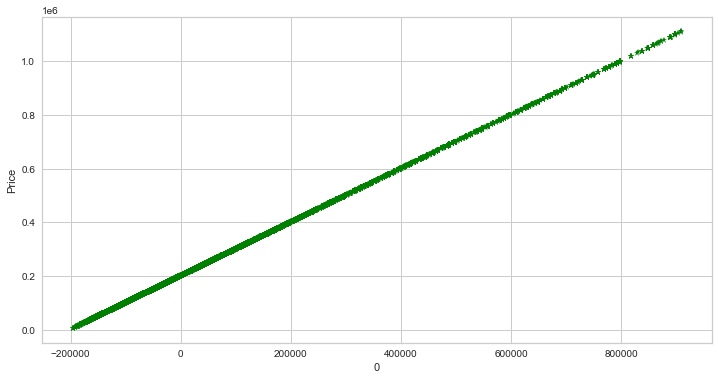

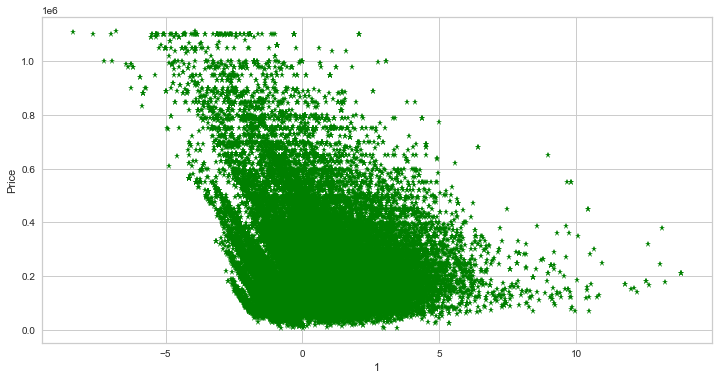

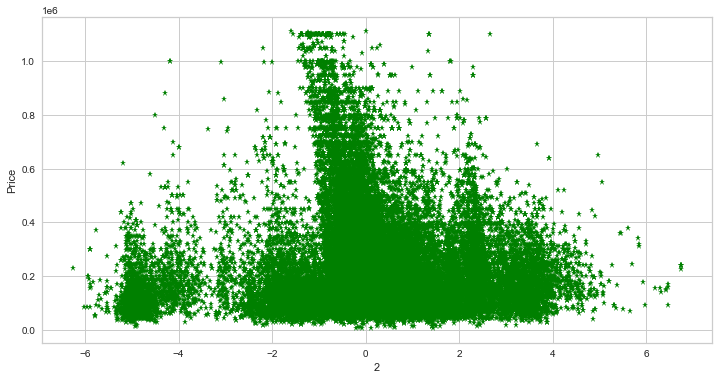

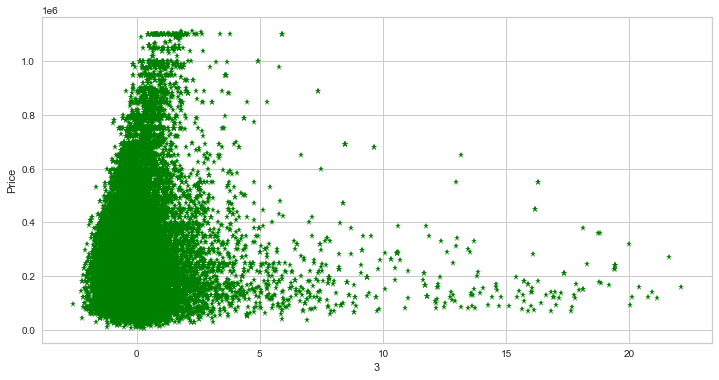

In [255]:
grafico(X_nuevo,'green')

- Entonces:
    - el primer feature de X_nuevo se relaciona directamente con el **precio** de las propiedades. La variable price explica completamente la formación de la misma.
    - el segundo feature de X_nuevo se puede relacionar con la cantidad de **espacios** del inmueble, ya que rooms y bedrooms tienen importante incidencia en su formación.
    - el tercer feature de X_nuevo se puede relacionar con la **ubicación** de la propiedad, ya que lat es la que mejor explica su varianza. 
    - el cuarto feature de X_nuevo se puede relacionar con el **tamaño de la propiedad** ya que surface_total es la que más incidencia tiene en su formación.

- Renombro las nuevas variables obtenidas con PCA entender mejor la Parte B del proyecto

In [256]:
X_nuevo.rename(columns={0:'Precio',1:'Espacios',2:'Ubicacion',3:'Tamano'},inplace=True)
X_nuevo.head(2)

,Precio,Espacios,Ubicacion,Tamano
0,-43269.243005,-0.711892,-0.323247,0.117165
1,-77269.243012,-1.098819,-0.136855,0.256989


## Parte B: Modelos Avanzados

- Resumen de los modelos de Machine Learning realizados en el Proyecto 1 

In [257]:
resumen=pd.DataFrame({'rmse test':[rmse_test1,rmse_test2rand,rmse_testtree1rand,rmse_testtree2,rmse_testknnrand1,rmse_testknn2,rmse_testarbol,rmse_testarbol2,rmse_testarbol3,rmse_testarbol4],'rmse train':[rmse_train1,rmse_train2rand,rmse_traintree1rand,rmse_traintree2,rmse_trainknnrand1,rmse_trainknn2,rmse_trainarbol,rmse_trainarbol2,rmse_trainarbol3,rmse_trainarbol4],'R²':[scorelinear_model1,scorelinear_model2rand,scoretree1rand,scoretree2,scoreknnrand1,scoreknn2,scorearbol,depto,casa,ph],'Hiperparámetros':['default','norm=True,fit_intercept=True','max_depth=26','max_depth=5','n_neighbors=27','n_neighbors=15','max_depth=3','max_depth=5','max_depth=5','max_depth=5'],'Randomized Search CV':['No','Si','Si','No','Si', 'No','No','No','No','No'],'Variables utilizadas':['Surface_total','surface_total, lat y lon','surface_total, lat y lon','surface_total, lat y lon','surface_total, lat y lon','surface_total, lat y lon','surface_total, lat, lon y rooms','surface_total, lat y lon','surface_total, lat y lon','surface_total, lat y lon'],'Tipo de Modelo':['Lineal','Lineal','Árbol','Árbol','Knn','Knn','Árbol','Árbol','Árbol','Árbol'],'Descripción':['Modelo Benchmark','Modelo Benchmark agregando variables','Árbol de decisión','Árbol de decisión con Cross Validation manual','Knn','Knn con Cross Validation manual','Árbol de decisión agregando rooms con Cross Validation','Árbol de decisión sólo prediciendo Deptos','Árbol de decisión sólo prediciendo Casa','Árbol de decisión sólo prediciendo PH']})
resumen = resumen[['Descripción', 'Tipo de Modelo', 'Variables utilizadas', 'Randomized Search CV', 'Hiperparámetros','R²','rmse train','rmse test']]
resumen.sort_values('R²',ascending=False)

,Descripción,Tipo de Modelo,Variables utilizadas,Randomized Search CV,Hiperparámetros,R²,rmse train,rmse test
2,Árbol de decisión,Árbol,"surface_total, lat y lon",Si,max_depth=26,0.958104,17296.605325,103724.976060
4,Knn,Knn,"surface_total, lat y lon",Si,n_neighbors=27,0.952581,17168.082929,110812.581914
7,Árbol de decisión sólo prediciendo Deptos,Árbol,"surface_total, lat y lon",No,max_depth=5,0.798895,135524.161121,135833.540347
9,Árbol de decisión sólo prediciendo PH,Árbol,"surface_total, lat y lon",No,max_depth=5,0.742241,58212.565571,58783.354519
3,Árbol de decisión con Cross Validation manual,Árbol,"surface_total, lat y lon",No,max_depth=5,0.728280,151389.570049,144324.134528
5,Knn con Cross Validation manual,Knn,"surface_total, lat y lon",No,n_neighbors=15,0.714606,151585.722977,156301.390424
8,Árbol de decisión sólo prediciendo Casa,Árbol,"surface_total, lat y lon",No,max_depth=5,0.669916,152099.204238,147344.841777
6,Árbol de decisión agregando rooms con Cross Va...,Árbol,"surface_total, lat, lon y rooms",No,max_depth=3,0.592279,185542.360370,176553.368416
1,Modelo Benchmark agregando variables,Lineal,"surface_total, lat y lon",Si,"norm=True,fit_intercept=True",0.526407,200169.284139,189792.069694
0,Modelo Benchmark,Lineal,Surface_total,No,default,0.471181,216861.793069,218633.410893


- Si bien en el proyecto 1 no realicé el preprocesamiento de datos adecuado, el mejor modelo lo obtuve con un árbol de decisión que solo predice el precio de los deptos (puesto 3), basandome en el valor de R², aunque teniendo un alto valor en ambos rmse. Los primeros dos modelos tienen gran diferencia entre rmse train y test, dando indicio de overfitting, por lo que no los tengo en cuenta.

### Vuelvo a entrenar el árbol de decisión para predecir únicamente departamentos realizado en el Proyecto 1 utilizando el nuevo dataset ###

- En el proyecto 01 llegué a la conclusión de que el mejor modelo para estimar el precio de las propiedades era el Árbol de decisión con *max_depth=5,max_features=3,random_state=42* utilizando las siguientes features: **Superficie total, Latitud y Longitud**

In [258]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn import tree
from sklearn.metrics import mean_squared_error
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import r2_score
from sklearn.model_selection import RandomizedSearchCV
from matplotlib import cm
from scipy.stats import randint as sp_randint
from matplotlib import pyplot
from sklearn.model_selection import validation_curve

- Primero voy a probar la performance del modelo utilizando las variables resultantes que obtuve de PCA, concatenadas con las categóricas.

In [259]:
proppca = pd.concat([prop,X_nuevo], axis=1,verify_integrity=True)
proppca.head(1)

,surface_total,surface_covered,lat,lon,rooms,bedrooms,bathrooms,l2,l3,price,...,Depósito,Local comercial,Lote,Oficina,Otro,PH,Precio,Espacios,Ubicacion,Tamano
0,-0.241989,-0.428744,-0.275572,0.36551,-0.860699,-1.040762,0.872289,0,Boedo,159000.0,...,0.0,0.0,0.0,0.0,0.0,1.0,-43269.243005,-0.711892,-0.323247,0.117165


In [260]:
proppca=proppca.drop(['surface_total','price','lat','rooms','bedrooms'],axis=1)

In [261]:
proppca.head(2)

,surface_covered,lon,bathrooms,l2,l3,Casa,Casa de campo,Departamento,Depósito,Local comercial,Lote,Oficina,Otro,PH,Precio,Espacios,Ubicacion,Tamano
0,-0.428744,0.365510,0.872289,0,Boedo,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-43269.243005,-0.711892,-0.323247,0.117165
1,-0.669902,0.254462,-0.696922,0,Palermo,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-77269.243012,-1.098819,-0.136855,0.256989


In [262]:
X=proppca[['Espacios','Ubicacion','Tamano']]
y=proppca[['Precio']]
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42)
tree=DecisionTreeRegressor(max_depth=5,max_features=3,random_state=42)
tree.fit(X_train, y_train)
y_train_pred = tree.predict(X_train)
y_test_pred = tree.predict(X_test)
rmse_trainarbol = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_testarbol = np.sqrt(mean_squared_error(y_test, y_test_pred))
print(f'Raíz del error cuadrático medio en Train: {"{0:.2f}".format(rmse_trainarbol)}')
print(f'Raíz del error cuadrático medio en Test: {"{0:.2f}".format(rmse_testarbol)}')
print(f'R² del modelo Benchmark: {"{0:.5f}".format(tree.score(X,y))}')
print(f'R² score de train del modelo Benchmark: {"{0:.5f}".format(r2_score(y_train,y_train_pred))}')
print(f'R² score de test del modelo Benchmark: {"{0:.5f}".format(r2_score(y_test,y_test_pred))}')
scorearbol=tree.score(X,y)

Raíz del error cuadrático medio en Train: 116309.76
Raíz del error cuadrático medio en Test: 115527.38
R² del modelo Benchmark: 0.31548
R² score de train del modelo Benchmark: 0.31626
R² score de test del modelo Benchmark: 0.31363


- El modelo desmejoró su performance, pasando de un R2 de 0.79 a uno de 0.31. No tiene sentido continuar con un dataset que arroje un R² tan insignificante, pero lo que decido **continuar con la base original sin reducción de dimensionalidad.**

- Pruebo nuevamenta el modelo con mejor performance en el proyecto 1 con la base original.

In [263]:
prop=prop.drop(['Depósito','Oficina','Lote','Otro','Local comercial'],axis=1)
X = prop.drop(['price','l3'],axis=1)
y = prop['price']

In [264]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42)
tree=DecisionTreeRegressor(max_depth=5,max_features=3,random_state=42)
tree.fit(X_train, y_train)
y_train_pred = tree.predict(X_train)
y_test_pred = tree.predict(X_test)
rmse_trainarbol = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_testarbol = np.sqrt(mean_squared_error(y_test, y_test_pred))
print(f'Raíz del error cuadrático medio en Train: {"{0:.2f}".format(rmse_trainarbol)}')
print(f'Raíz del error cuadrático medio en Test: {"{0:.2f}".format(rmse_testarbol)}')
print(f'R² del modelo Benchmark: {"{0:.5f}".format(tree.score(X,y))}')
print(f'R² score de train del modelo Benchmark: {"{0:.5f}".format(r2_score(y_train,y_train_pred))}')
print(f'R² score de test del modelo Benchmark: {"{0:.5f}".format(r2_score(y_test,y_test_pred))}')
scorearbol=tree.score(X,y)

Raíz del error cuadrático medio en Train: 91980.24
Raíz del error cuadrático medio en Test: 92613.13
R² del modelo Benchmark: 0.56839
R² score de train del modelo Benchmark: 0.57239
R² score de test del modelo Benchmark: 0.55891


- En mi opinión, el primer modelo realizado tenía una "buena" performance ficticia, ya que utilizaba variables con diferentes escalas. Lo que se debe hacer ahora es, con todo lo aprendido en el bloque 2, volver a encontrar los mejores hiperparámetros a considerar y las features a utilizar implementando modelos más avanzados.

## Parte B: Modelos Avanzados

### 6. a) Primer modelo avanzado: Regresión Lineal con Lasso

- En primer lugar, comenzaré entrenando el primer modelo con atributos polinómicos, utilizando *Cross Validation* en los casos de ser necesario para mejorar el modelo.

In [265]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge, Lasso


- El análisis se concentrará únicamente para predecir propiedades destinadas a vivienda, como lo son: Casa, Casa de Campo, PH y Departamento. Es por eso que limito el dataset antes de definir las variables independientes y la dependiente.

In [266]:
X = prop.drop(['price','l3'],axis=1)
y = prop['price']

- Hacemos traint/test split y defino el 30% de los datos para el tamaño de test

In [267]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [268]:
lineal= LinearRegression()
lineal.fit(X_train, y_train)
y_train_pred_lineal = lineal.predict(X_train)
y_test_pred_lineal = lineal.predict(X_test)
print(f'Coeficientes del modelo: {lineal.coef_.round(4)}\ny su intercepto: {lineal.intercept_.round(4)}')

Coeficientes del modelo: [   881.2882  76910.8585  38307.5153  31938.5616  16271.7839  -5949.4733
  39852.8902 -38231.9787   4873.7362  19415.7912 100653.9077  55338.9229]
y su intercepto: 131060.0179


In [269]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

kf = KFold(n_splits=5)
scores = cross_val_score(lineal, X_train, y_train, cv=kf, scoring="r2")

In [272]:
score_pred = r2_score(y_test, y_test_pred_lineal)
print("Metricas cross_validation", scores.mean())
print("Metrica en Test", score_pred)

Metricas cross_validation 0.5989029341719909
Metrica en Test 0.6045282269550902


- Se obtiene un mejor R² haciendo train/test split en el modelo

- Calculamos el rmse y el R²

Raíz del error cuadrático medio en Train: 89067.50441
Raíz del error cuadrático medio en Test: 87692.95719
R² del modelo: 0.60453


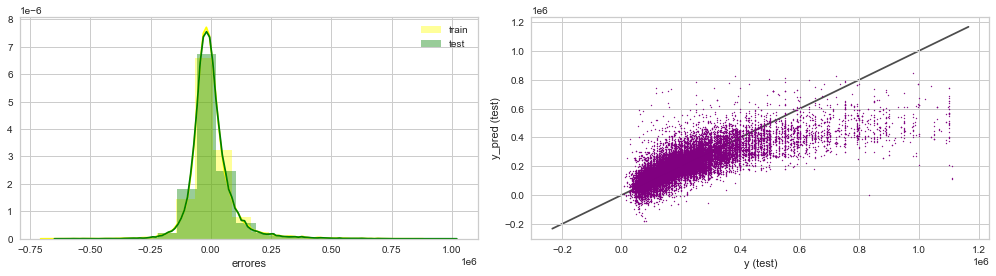

In [273]:
from sklearn.metrics import mean_squared_error

rmse_trainlineal = np.sqrt(mean_squared_error(y_train, y_train_pred_lineal))
rmse_testlineal = np.sqrt(mean_squared_error(y_test, y_test_pred_lineal))
scorelineal=r2_score(y_test,y_test_pred_lineal)
print(f'Raíz del error cuadrático medio en Train: {np.round(rmse_trainlineal,5)}')
print(f'Raíz del error cuadrático medio en Test: {np.round(rmse_testlineal,5)}')
print(f'R² del modelo: {np.round(scorelineal,5)}')
plt.figure(figsize = (14,4))

plt.subplot(1,2,1)
sn.distplot(y_train - y_train_pred_lineal, bins = 20, label = 'train',color='yellow')
sn.distplot(y_test - y_test_pred_lineal, bins = 20, label = 'test',color='green')
plt.xlabel('errores')
plt.legend()


ax = plt.subplot(1,2,2)
ax.scatter(y_test,y_test_pred_lineal, s =2,marker='*',c='purple')

lims = [
np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes]
]

ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
plt.xlabel('y (test)')
plt.ylabel('y_pred (test)')

plt.tight_layout()
plt.show()

- Viendo los coeficientes del modelo podemos observar cómo influye cada variable en la determinación del precio de la propiedad.

In [274]:
coeff_df = pd.DataFrame(lineal.coef_, X.columns, columns=['Coefficient'])  
coeff_df.sort_values('Coefficient',ascending=False)

,Coefficient
Departamento,100653.907707
surface_covered,76910.858462
PH,55338.922930
bathrooms,39852.890196
lat,38307.515339
lon,31938.561628
Casa de campo,19415.791174
rooms,16271.783861
Casa,4873.736222
surface_total,881.288153


- En este caso, cuando la variable departamento toma valor 1, el precio de la propiedad aumenta en más de 100.000 USD, y cuando la propiedad es de Gran Buenos Aires (l2=1), el precio disminuye más de 38.000 USD.

- A la regresión lineal le agrego **atributos polinómicos** a ver si mejora la estimación. Para ello, hago Cross Validation para encontrar la cantidad de degrees necesarios para alcanzar el rmse óptimo del modelo.

Mejor grado 3 con RMSE en test de 69057.70091179936


Text(0, 0.5, 'RMSE en test')

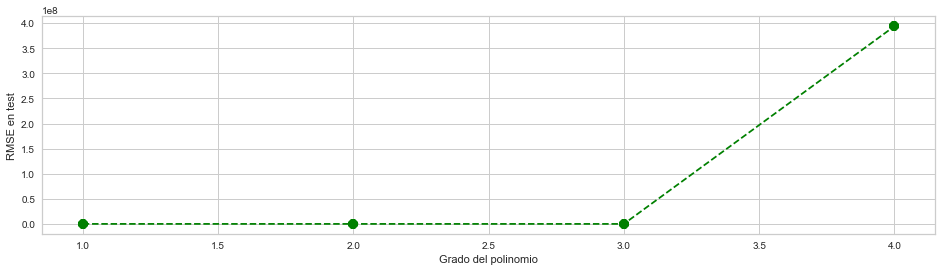

In [275]:
rmses = []
degrees = np.arange(1, 5)
min_rmse, min_deg = 1e10, 0

for deg in degrees:

    
    poly_features = PolynomialFeatures(degree=deg, include_bias=True)
    X_poly_train = poly_features.fit_transform(X_train)
    poly_reg = LinearRegression()
    poly_reg.fit(X_poly_train, y_train)

    # Comparación con test
    X_poly_test = poly_features.fit_transform(X_test)
    y_test_predpoly = poly_reg.predict(X_poly_test)
    poly_mse = mean_squared_error(y_test, y_test_predpoly)
    poly_rmse = np.sqrt(poly_mse)
    rmses.append(poly_rmse)
    
    
    if min_rmse > poly_rmse:
        min_rmse = poly_rmse
        min_deg = deg


print('Mejor grado {} con RMSE en test de {}'.format(min_deg, min_rmse))
fig = plt.figure(figsize=(16,4))
ax = fig.add_subplot(111)
ax.plot(degrees, rmses,'--r', marker='8', markersize=10, color='green')
ax.set_xlabel('Grado del polinomio')
ax.set_ylabel('RMSE en test')

- La mejor performance se obtiene con un **polinomio de grado 3.**

In [276]:
poly = PolynomialFeatures(degree = 3, include_bias=True)
X_train_polin = poly.fit_transform(X_train)
X_test_polin = poly.fit_transform(X_test)
print(f'Tamaño de X_train: {X_train.shape} y de X_test: {X_test.shape}')
print(f'Tamaño del nuevo X_train: {X_train_polin.shape} y del nuevo X_test: {X_test_polin.shape}')

Tamaño de X_train: (74412, 12) y de X_test: (31892, 12)
Tamaño del nuevo X_train: (74412, 455) y del nuevo X_test: (31892, 455)


- Entreno una nueva regresión lineal aplicando PolynomialFeatures

In [277]:
lineal2 = LinearRegression()
lineal2.fit(X_train_polin, y_train)
y_train_pred_lineal2 = lineal2.predict(X_train_polin)
y_test_pred_lineal2 = lineal2.predict(X_test_polin)

In [279]:
kf = KFold(n_splits=5)
scores2 = cross_val_score(lineal2, X_train, y_train, cv=kf, scoring="r2")
score_pred2 = r2_score(y_test, y_test_pred_lineal2)
print("Metricas cross_validation", scores2.mean())
print("Metrica en Test", score_pred2)

Metricas cross_validation 0.5989029341719909
Metrica en Test 0.7547492800493347


- Se obtiene un mejor R² haciendo train/test split en el modelo

- Evaluación del RMSE y R²:

Raíz del error cuadrático medio en Train: 68192.85924
Raíz del error cuadrático medio en Test: 69057.70091
R² del modelo: 0.75475


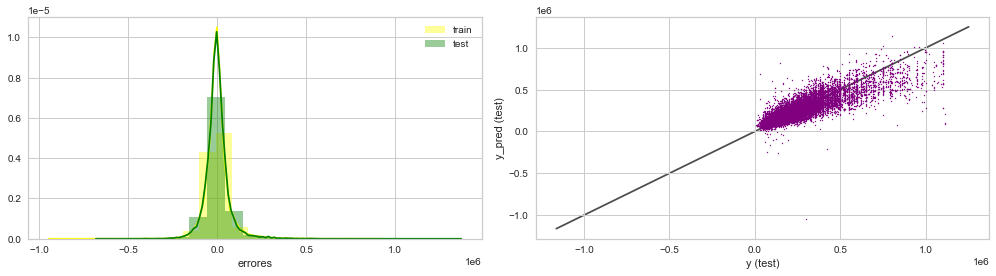

In [280]:
rmse_trainlineal2 = np.sqrt(mean_squared_error(y_train, y_train_pred_lineal2))
rmse_testlineal2 = np.sqrt(mean_squared_error(y_test, y_test_pred_lineal2))
scorelineal2=r2_score(y_test, y_test_pred_lineal2)
print(f'Raíz del error cuadrático medio en Train: {np.round(rmse_trainlineal2,5)}')
print(f'Raíz del error cuadrático medio en Test: {np.round(rmse_testlineal2,5)}')
print(f'R² del modelo: {np.round(scorelineal2,5)}')

plt.figure(figsize = (14,4))

plt.subplot(1,2,1)
sn.distplot(y_train - y_train_pred_lineal2, bins = 20, label = 'train',color='yellow')
sn.distplot(y_test - y_test_pred_lineal2, bins = 20, label = 'test',color='green')
plt.xlabel('errores')
plt.legend()


ax = plt.subplot(1,2,2)
ax.scatter(y_test,y_test_pred_lineal2, s =2,marker='*',c='purple')

lims = [
np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes]
]

ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
plt.xlabel('y (test)')
plt.ylabel('y_pred (test)')

plt.tight_layout()
plt.show()

- Ahora le voy a aplicar la Regularización Lasso, técnica para controlar el error si nos excedemos al agregar atributos.

- Para obtener el valor óptimo de alpha, utilizamos LassoCV

In [281]:
from sklearn.linear_model import Ridge, Lasso
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.model_selection import cross_val_score

In [282]:
lassocv = LassoCV(alphas = None, cv = 5, max_iter = 10000, normalize = True)
lassocv.fit(X_train_polin, y_train)
print(f'El valor óptimo de alpha para trabajar con los datos extraídos de PolynomialFeatures es {lassocv.alpha_}')

El valor óptimo de alpha para trabajar con los datos extraídos de PolynomialFeatures es 0.36090329081422373


In [283]:
reg_lasso = Lasso(alpha=0.36,tol=0.01,max_iter=2000)
reg_lasso.fit(X_train_polin,y_train)

C:\Users\florb\miniconda3\envs\datascience\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:474: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 174083571653409.1, tolerance: 14722569278350.375



Lasso(alpha=0.36, copy_X=True, fit_intercept=True, max_iter=2000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.01, warm_start=False)

In [284]:
coeff_df2 = pd.DataFrame({'Features':poly.get_feature_names(X_train.columns),'Coeficientes': reg_lasso.coef_})
coeff_df2.sort_values('Coeficientes',ascending=False)

,Features,Coeficientes
2,surface_covered,109156.343644
3,lat,102415.236824
321,lon l2 Casa,96194.687833
223,surface_covered l2 Departamento,88219.106181
27,surface_covered lon,74760.781667
...,...,...
157,surface_total l2 Departamento,-75808.028058
9,Casa,-96964.393074
325,lon Casa^2,-104899.348427
220,surface_covered l2^2,-109192.570385


- En este caso, la variable más relevante de las que incide positivamente en el precio es la superficie cubierta, seguida por latitud. En este modelo, cuando la propiedad es de Gran Buenos Aires (l2=1), el precio disminuye más de 111.000 USD.

- Lasso penaliza a las variables irrelevantes en el análisis, estableciendo un coeficiente =0 para eliminar su participación en la predicción de y. En este caso, existen 80 variables irrelevantes en el análisis.

In [285]:
coeff_df2[coeff_df2['Coeficientes']==0]

,Features,Coeficientes
0,1,0.0
43,lat Casa de campo,-0.0
60,rooms Casa de campo,-0.0
67,bedrooms Casa de campo,-0.0
78,l2 Casa de campo,-0.0
...,...,...
448,Casa de campo Departamento^2,0.0
449,Casa de campo Departamento PH,0.0
450,Casa de campo PH^2,0.0
452,Departamento^2 PH,0.0


In [286]:
y_train_lasso = reg_lasso.predict(X_train_polin)
y_test_lasso = reg_lasso.predict(X_test_polin)

In [288]:
kf = KFold(n_splits=5)
scores3 = cross_val_score(reg_lasso, X_train_polin, y_train, cv=kf, scoring="r2")
score_pred3 = r2_score(y_test, y_test_lasso)
print("Metricas cross_validation", scores3.mean())
print("Metrica en Test", score_pred3)

C:\Users\florb\miniconda3\envs\datascience\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:474: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 139062529929300.4, tolerance: 11848973394103.465

C:\Users\florb\miniconda3\envs\datascience\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:474: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 140273473571666.62, tolerance: 11848559816752.654

C:\Users\florb\miniconda3\envs\datascience\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:474: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 138884797012454.3, tolerance: 11780152520128.766

C:\Users\florb\miniconda3\envs\datascience\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:474: ConvergenceWarning:

Objective did not converge. You might want 

Metricas cross_validation 0.741497235142624
Metrica en Test 0.758066096341393


C:\Users\florb\miniconda3\envs\datascience\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:474: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 138405420917519.95, tolerance: 11693861350035.15



- Se obtiene un mejor R² haciendo train/test split en el modelo

- Evaluación del RMSE y R²:

Raíz del error cuadrático medio en Train: 68411.63832
Raíz del error cuadrático medio en Test: 68589.13669
R² del modelo: 0.75807


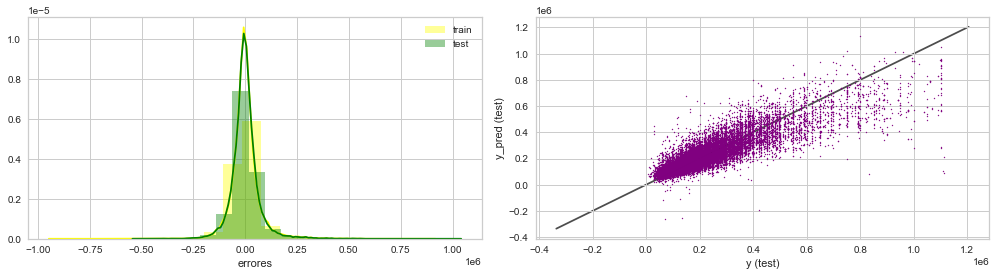

In [289]:
rmse_trainlasso = np.sqrt(mean_squared_error(y_train, y_train_lasso))
rmse_testlasso = np.sqrt(mean_squared_error(y_test, y_test_lasso))
scorelasso=r2_score(y_test,y_test_lasso)
print(f'Raíz del error cuadrático medio en Train: {np.round(rmse_trainlasso,5)}')
print(f'Raíz del error cuadrático medio en Test: {np.round(rmse_testlasso,5)}')
print(f'R² del modelo: {np.round(scorelasso,5)}')

plt.figure(figsize = (14,4))

plt.subplot(1,2,1)
sn.distplot(y_train - y_train_lasso, bins = 20, label = 'train',color='yellow')
sn.distplot(y_test - y_test_lasso, bins = 20, label = 'test',color='green')
plt.xlabel('errores')
plt.legend()


ax = plt.subplot(1,2,2)
ax.scatter(y_test,y_test_lasso, s =2,marker='*',c='purple')

lims = [
np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes]
]

ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
plt.xlabel('y (test)')
plt.ylabel('y_pred (test)')

plt.tight_layout()
plt.show()

### 6. b) XGBoosting

In [290]:
import xgboost as xgb
from xgboost import plot_importance

In [291]:
X_train, X_test, y_train, y_test = train_test_split (X, y, test_size = 0.3, random_state = 42)

- En primer lugar utilizo parámetros por defecto con un eta=0.5

In [292]:
xg_reg = xgb.XGBRegressor(eta=0.5,booster='gbtree')
#learning_rate: reescala los pesos que va dando a los arboles
xg_reg.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, eta=0.5, gamma=0,
             gpu_id=-1, importance_type='gain', interaction_constraints='',
             learning_rate=0.5, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=0, num_parallel_tree=1,
             objective='reg:squarederror', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [293]:
kfold = KFold(n_splits=5)
results = cross_val_score(xg_reg, X_train, y_train, cv=kfold,scoring="r2")

In [294]:
DTrain = xgb.DMatrix(X_train, y_train)
x_parameters = {"eta":0.5}
xgb.cv(x_parameters, DTrain)

,train-rmse-mean,train-rmse-std,test-rmse-mean,test-rmse-std
0,138963.729167,536.895271,139387.739583,1335.747930
1,90966.822917,665.660453,91923.018230,1389.766472
2,71512.906250,706.029360,73202.096354,680.972701
3,63970.803386,609.983616,66112.937500,302.050629
4,60875.468750,643.647886,63289.635417,327.933680
5,59197.205729,634.817653,62022.561198,240.915615
6,58164.261719,581.542927,61345.694011,277.021770
7,57016.354167,853.795411,60571.552083,86.023995
8,56348.190104,852.716279,60072.751302,144.256112
9,55840.253907,749.273624,59735.248698,220.795610


In [295]:
y_test_predxg = xg_reg.predict(X_test)
y_train_predxg = xg_reg.predict(X_train)

In [296]:
scorexg=r2_score(y_train,y_train_predxg)
print("Metricas cross_validation", results.mean())
print("Metrica en Test", scorexg)

Metricas cross_validation 0.8652093179755462
Metrica en Test 0.9241939749779161


- Se obtiene un mejor R² haciendo train/test split en el modelo

Score del modelo con xgboost: 0.92419
Raíz del error cuadrático medio en Train: 38727.74204
Raíz del error cuadrático medio en Test: 49913.88372


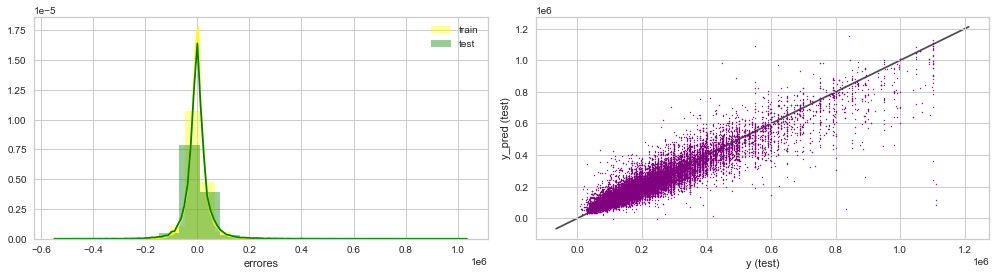

In [297]:
print(f'Score del modelo con xgboost: {np.round(scorexg,5)}')
rmse_trainxg = np.sqrt(mean_squared_error(y_train, y_train_predxg))
rmse_testxg = np.sqrt(mean_squared_error(y_test, y_test_predxg))
print(f'Raíz del error cuadrático medio en Train: {np.round(rmse_trainxg,5)}')
print(f'Raíz del error cuadrático medio en Test: {np.round(rmse_testxg,5)}')
plt.figure(figsize = (14,4))

plt.subplot(1,2,1)
sn.distplot(y_train - y_train_predxg, bins = 20, label = 'train',color='yellow')
sn.distplot(y_test - y_test_predxg, bins = 20, label = 'test',color='green')
plt.xlabel('errores')
plt.legend()


ax = plt.subplot(1,2,2)
ax.scatter(y_test,y_test_predxg, s =2,marker='*',c='purple')

lims = [
np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes]
]

ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
plt.xlabel('y (test)')
plt.ylabel('y_pred (test)')

plt.tight_layout()
plt.show()

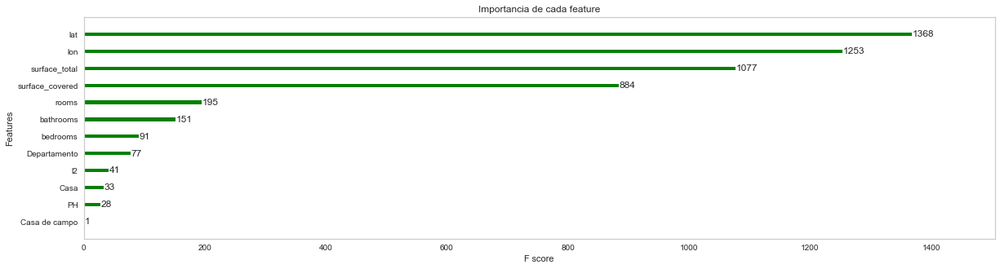

In [298]:
from xgboost import plot_importance
plot_importance(xg_reg, title='Importancia de cada feature',grid=False, color='green')

- Las variables más relevantes para XGBoost son: la ubicación, la superficie total y la cubierta del modelo. Me parece lo más acorde a lo que uno intuye, acompañado por lo que se puede concluir a partir del preprocesamiento de datos.

- El modelo xgboost con un eta:0.5 me da una buena performance, conservando la importancia de cada feature que ya supuse en el proyecto 1

**Resumen de las métricas más importantes de los modelos obtenidos hasta ahora sin optimizar hiperparámetros**

In [299]:
import plotly.express as px
scores=pd.DataFrame({'R²':[scorelineal,scorelineal2,scorelasso,scorexg],'rmse train':[rmse_trainlineal,rmse_trainlineal2,rmse_trainlasso,rmse_trainxg],'rmse test':[rmse_testlineal,rmse_testlineal2,rmse_testlasso,rmse_testxg]},index=['Regresión lineal','Regresión lineal con Polynomial Features','Regularización con Lasso','XGBoosting'])
fig = px.bar(scores, y=scores['rmse test'],color='R²', barmode='group')
fig.show()

- Hasta el momento, la mejor performance la tiene la **regresión realizada con XGBoosting.**

### 7. Optimización de Hiperparámetros con GridSearchCV y RandomizedGridSearchCV

- Optimización de hiperparámetros de la **Regresión Lineal (inciso a).** Se eligieron los parámetros que habia disponibles en la Regresión  Lineal y se dispuso un np.arange para n_jobs que va hasta 20 iteraciones por una cuestión de costo computacional.

In [300]:
import sklearn.metrics as metrics
from sklearn.model_selection import learning_curve

In [301]:
param_grid = {'fit_intercept':['True','False'],
              'normalize': ['True','False'], 
              'copy_X':['True','False'],
              'n_jobs':np.arange(1, 20)}
optlineal = GridSearchCV(lineal, param_grid=param_grid, cv=5,verbose=1)

- Se entrena el modelo con los mejores hiperparámetros obtenidos con *GridSearchCV.*

In [302]:
optlineal.fit(X_train, y_train)

Fitting 5 folds for each of 152 candidates, totalling 760 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 760 out of 760 | elapsed:   25.3s finished


GridSearchCV(cv=5, error_score=nan,
             estimator=LinearRegression(copy_X=True, fit_intercept=True,
                                        n_jobs=None, normalize=False),
             iid='deprecated', n_jobs=None,
             param_grid={'copy_X': ['True', 'False'],
                         'fit_intercept': ['True', 'False'],
                         'n_jobs': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19]),
                         'normalize': ['True', 'False']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=1)

In [303]:
print("Mejores parametros: "+str(optlineal.best_params_))
print("Mejor Score: "+str(optlineal.best_score_)+'\n')

scoreoptlineal = pd.DataFrame(optlineal.cv_results_)
scoreoptlineal.head(3)

Mejores parametros: {'copy_X': 'True', 'fit_intercept': 'True', 'n_jobs': 1, 'normalize': 'True'}
Mejor Score: 0.5989029341719909



,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_copy_X,param_fit_intercept,param_n_jobs,param_normalize,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.024536,0.003600,0.002592,0.000796,True,True,1,True,"{'copy_X': 'True', 'fit_intercept': 'True', 'n...",0.593144,0.614622,0.598734,0.594551,0.593464,0.598903,0.00811,1
1,0.024136,0.002779,0.002593,0.000489,True,True,1,False,"{'copy_X': 'True', 'fit_intercept': 'True', 'n...",0.593144,0.614622,0.598734,0.594551,0.593464,0.598903,0.00811,1
2,0.018351,0.001492,0.002194,0.000399,True,True,2,True,"{'copy_X': 'True', 'fit_intercept': 'True', 'n...",0.593144,0.614622,0.598734,0.594551,0.593464,0.598903,0.00811,1


- Entreno nuevamente el modelo de Regresión Lineal con los hiperparámetros óptimos

In [304]:
lineal2= LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=True)
lineal2.fit(X_train, y_train)
y_train_pred_lineal2 = lineal2.predict(X_train)
y_test_pred_lineal2 = lineal2.predict(X_test)

Raíz del error cuadrático medio en Train: 89067.50441
Raíz del error cuadrático medio en Test: 87692.95719
R² del modelo: 0.59904


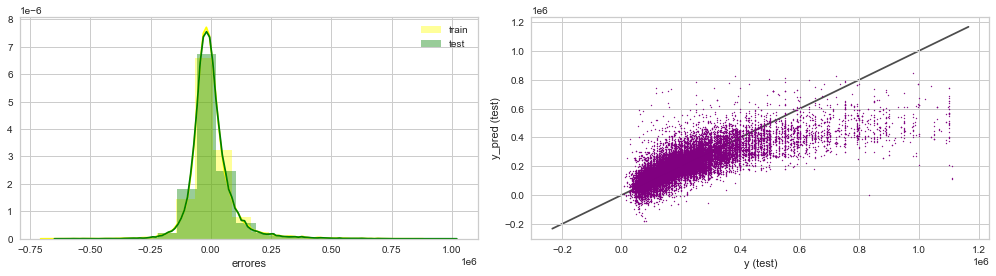

In [305]:
rmse_trainlinealopt = np.sqrt(mean_squared_error(y_train, y_train_pred_lineal2))
rmse_testlinealopt = np.sqrt(mean_squared_error(y_test, y_test_pred_lineal2))
scorelinealopt=r2_score(y_train, y_train_pred_lineal2)
print(f'Raíz del error cuadrático medio en Train: {np.round(rmse_trainlinealopt,5)}')
print(f'Raíz del error cuadrático medio en Test: {np.round(rmse_testlinealopt,5)}')
print(f'R² del modelo: {np.round(scorelinealopt,5)}')

plt.figure(figsize = (14,4))

plt.subplot(1,2,1)
sn.distplot(y_train - y_train_pred_lineal2, bins = 20, label = 'train',color='yellow')
sn.distplot(y_test - y_test_pred_lineal2, bins = 20, label = 'test',color='green')
plt.xlabel('errores')
plt.legend()


ax = plt.subplot(1,2,2)
ax.scatter(y_test,y_test_pred_lineal2, s =2,marker='*',c='purple')

lims = [
np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes]
]

ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
plt.xlabel('y (test)')
plt.ylabel('y_pred (test)')

plt.tight_layout()
plt.show()

- Comparación de R² entre el modelo con los parámetros por default y los obtenidos a partir de la optimización de hiperparámetros

In [306]:
print(f'Sin optimización de hiperparámetros: {np.round(scorelineal,6)}')
print(f'Con optimización de hiperparámetros: {np.round(scorelinealopt,6)}')

Sin optimización de hiperparámetros: 0.604528
Con optimización de hiperparámetros: 0.599043


- No existe diferencia entre el modelo con optimización a partir de *GridSearchCV* y el establecido por default en el apartado anterior.

- Los hiperparámetros de *PolynomialFeatures* y la regularización por Lasso ya fueron optimizados a través de *Cross Validation* en el apartado anterior.

- Optimización de hiperparámetros para **XGBoosting (inciso b).** Los parámetros a optimizar son:
        -"gamma": se dispuso un arange que va hasta 10. Cuanto mayor sea gamma, más conservador es el modelo.
        -"eta": permite prevenir overfitting. Por default es 0.3, pero le impongo un arange hasta 0.9 para que busque el óptimo.
       -"Max_depth": profundidad máxima del árbol. Cuanto más profundo, mayor posibilidad de overfitting.

In [307]:
parameters = {'gamma':np.arange(0,10,1),'eta':np.arange(0,1,0.1), 'max_depth': np.arange(0,10)}

xg_regopt = RandomizedSearchCV(xg_reg, parameters, cv = 5, n_jobs = 10, verbose=True)

xg_regopt.fit(X_train, y_train)



Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   57.9s
[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:  1.5min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                          colsample_bylevel=1,
                                          colsample_bynode=1,
                                          colsample_bytree=1, eta=0.5, gamma=0,
                                          gpu_id=-1, importance_type='gain',
                                          interaction_constraints='',
                                          learning_rate=0.5, max_delta_step=0,
                                          max_depth=6, min_child_weight=1,
                                          missing=nan,
                                          monotone_constraints='()',
                                          n_estimators=100,...
                                          subsample=1, tree_method='exact',
                                          validate_parameters=1,
                                          verbos

In [308]:
print(f'El mejor score que se alcanza es: {xg_regopt.best_score_} con los siguientes parámetros: {xg_regopt.best_params_}')

El mejor score que se alcanza es: 0.8831765857906555 con los siguientes parámetros: {'max_depth': 8, 'gamma': 2, 'eta': 0.8}


In [309]:
scoresxgopt = pd.DataFrame(xg_regopt.cv_results_)
scoresxgopt.head(3)
scorexgopt=xg_regopt.best_score_

- Entreno nuevamente el modelo con los hiperparámetros óptimos obtenidos.

In [310]:
xg_reg2 = xgb.XGBRegressor(eta=0.8,gamma=7,max_depth=9,booster='gbtree')

xg_reg2.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, eta=0.8, gamma=7,
             gpu_id=-1, importance_type='gain', interaction_constraints='',
             learning_rate=0.800000012, max_delta_step=0, max_depth=9,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=0, num_parallel_tree=1,
             objective='reg:squarederror', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [311]:
y_test_predxg2 = xg_reg2.predict(X_test)
y_train_predxg2 = xg_reg2.predict(X_train)

Score del modelo con xgboost: 0.98068
Raíz del error cuadrático medio en Train: 19550.12666
Raíz del error cuadrático medio en Test: 48251.7703


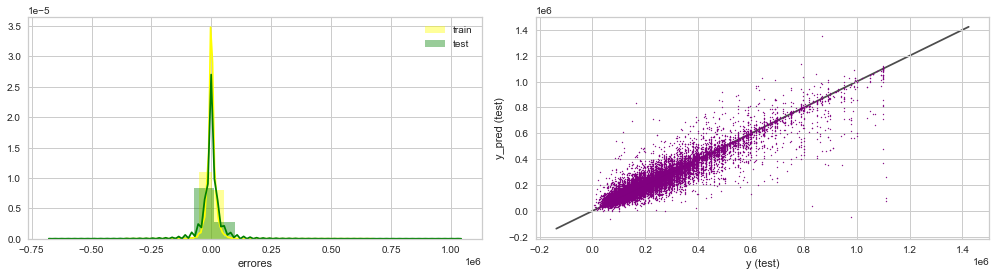

In [312]:
scorexgopt=r2_score(y_train,y_train_predxg2)
print(f'Score del modelo con xgboost: {np.round(scorexgopt,5)}')
rmse_trainxg2 = np.sqrt(mean_squared_error(y_train, y_train_predxg2))
rmse_testxg2 = np.sqrt(mean_squared_error(y_test, y_test_predxg2))
print(f'Raíz del error cuadrático medio en Train: {np.round(rmse_trainxg2,5)}')
print(f'Raíz del error cuadrático medio en Test: {np.round(rmse_testxg2,5)}')
plt.figure(figsize = (14,4))

plt.subplot(1,2,1)
sn.distplot(y_train - y_train_predxg2, bins = 20, label = 'train',color='yellow')
sn.distplot(y_test - y_test_predxg2, bins = 20, label = 'test',color='green')
plt.xlabel('errores')
plt.legend()


ax = plt.subplot(1,2,2)
ax.scatter(y_test,y_test_predxg2, s =2,marker='*',c='purple')

lims = [
np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes]
]

ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
plt.xlabel('y (test)')
plt.ylabel('y_pred (test)')

plt.tight_layout()
plt.show()

In [313]:
print(f'Sin optimización de hiperparámetros: {np.round(scorexg,6)}')
print(f'Con optimización de hiperparámetros: {np.round(scorexgopt,6)}')

Sin optimización de hiperparámetros: 0.924194
Con optimización de hiperparámetros: 0.980682


In [314]:
scores2=pd.DataFrame({'R²':[scorexgopt,scorelinealopt],'rmse train':[rmse_trainxg2,rmse_trainlinealopt],'rmse test':[rmse_testxg2,rmse_testlinealopt]},index=['XGBoost con optimización','Regresión lineal con optimización'])
scores2

,R²,rmse train,rmse test
XGBoost con optimización,0.980682,19550.126663,48251.770304
Regresión lineal con optimización,0.599043,89067.504408,87692.957186


In [315]:
scorefinal=pd.concat([scores,scores2])
fig2 = px.bar(scorefinal, y=scorefinal['rmse test'],color='R²', barmode='group')
fig2.update_layout(xaxis={'categoryorder':'total ascending'},title_text='RMSE test y R² de cada modelo')
fig2.show()

### 8. Comparación de modelos con PARTE A.

- En la parte A hice un resumen de los modelos realizados en el Proyecto 1 y estimé el modelo que mejor performance me habia dado utilizando los datos del nuevo dataset.

- En mi opinión, hay cierto sesgo con los modelos del proyecto 1 por una cuestión de no tener los datos debidamente procesados, haciendo que un modelo con buena performance pueda resultar ficticia.

In [316]:
arbol=pd.DataFrame({'R²':[scorearbol],'rmse test':[rmse_testarbol],'rmse train':[rmse_trainarbol]},index=['Árbol Parte A'])
scorefinal2=pd.concat([scorefinal,arbol])
scorefinal2.sort_values('rmse test')

,R²,rmse train,rmse test
XGBoost con optimización,0.980682,19550.126663,48251.770304
XGBoosting,0.924194,38727.742039,49913.883715
Regularización con Lasso,0.758066,68411.638324,68589.136694
Regresión lineal con Polynomial Features,0.754749,68192.859236,69057.700912
Regresión lineal,0.604528,89067.504408,87692.957186
Regresión lineal con optimización,0.599043,89067.504408,87692.957186
Árbol Parte A,0.568394,91980.244157,92613.126561


In [317]:
import plotly.graph_objects as go

modelos = scorefinal2.index

fig = go.Figure()
fig.add_trace(go.Bar(x=modelos, y=scorefinal2['rmse train'],
                marker_color='crimson',
                name='rmse train'))
fig.add_trace(go.Bar(x=modelos, y=scorefinal2['rmse test'],
                base=0,
                marker_color='lightslategrey',
                name='rmse test'
                ))
fig.update_layout(title_text='RMSE test y RMSE train de cada modelo')
fig.show()

colors = ['lightslategray',] * 7
colors[4] = 'lightsalmon'
fig2=go.Figure(go.Bar(y=modelos, x=scorefinal2['R²'],
                marker_color=colors, orientation='h',
                name='R²',text=np.round(scorefinal2['R²'],3)))
fig2.update_traces(textposition='outside')
fig2.update_layout(yaxis={'categoryorder':'total ascending'},title_text='Valor de R² para cada modelo')
fig2.show()

## Parte C: Interpretación de Modelos

- La parte C la responderé a través del **Modelo XGBoosting con Optimización de Hiperparámetros** y el de **Regresión Lineal con Lasso** por ser dos de los modelos distintos entre sí y con mejor performance obtenida.

### 9. a) ¿Qué variables fueron relevantes para el modelo?

- Variables relevantes para XGBoosting con Optimización de Hiperparámetros

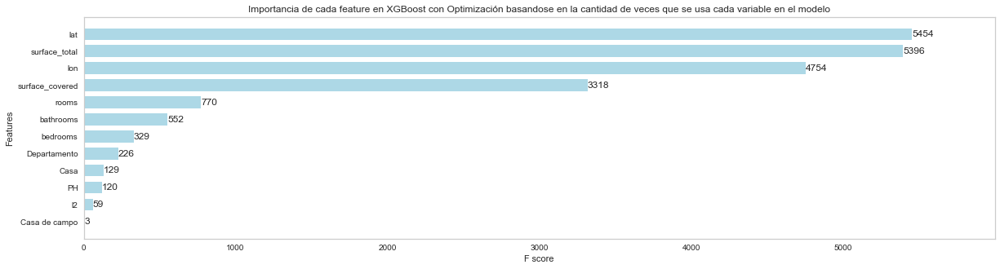

In [318]:
plot_importance(xg_reg2, title='Importancia de cada feature en XGBoost con Optimización basandose en la cantidad de veces que se usa cada variable en el modelo',grid=False, color='lightblue',height=0.7)

- Elección de árboles al azar para corroborar la importancia de las features obtenida en el gráfico

In [319]:
!pip install graphviz

In [320]:
from xgboost import plot_tree
#fig,ax= plt.subplots(figsize=(10,30))
#plot_tree(xg_reg2,num_trees=2,rankdir='LR',ax=ax)
#plt.savefig("arbol.pdf")
plot_tree(xg_reg2,num_trees=1)
fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.346052 to fit


- No hay forma de poder ver un árbol de Xgboost. Son de muy gran tamaño.

- Variables importantes en la Regresión Lineal con Lasso, eliminando las que tengan valor 0.

In [321]:
lasso=coeff_df2[coeff_df2!=0]
lasso=lasso.dropna()

In [322]:
lasso.reset_index(inplace=True)

In [323]:
lasso.sort_values('Coeficientes',inplace=True,ascending=False)
lasso=lasso[['Features','Coeficientes']]
lasso.set_index('Features', inplace=True)

In [324]:
lasso

,Coeficientes
Features,
surface_covered,109156.343644
lat,102415.236824
lon l2 Casa,96194.687833
surface_covered l2 Departamento,88219.106181
surface_covered lon,74760.781667
...,...
surface_total l2 Departamento,-75808.028058
Casa,-96964.393074
lon Casa^2,-104899.348427


<Figure size 1008x432 with 0 Axes>

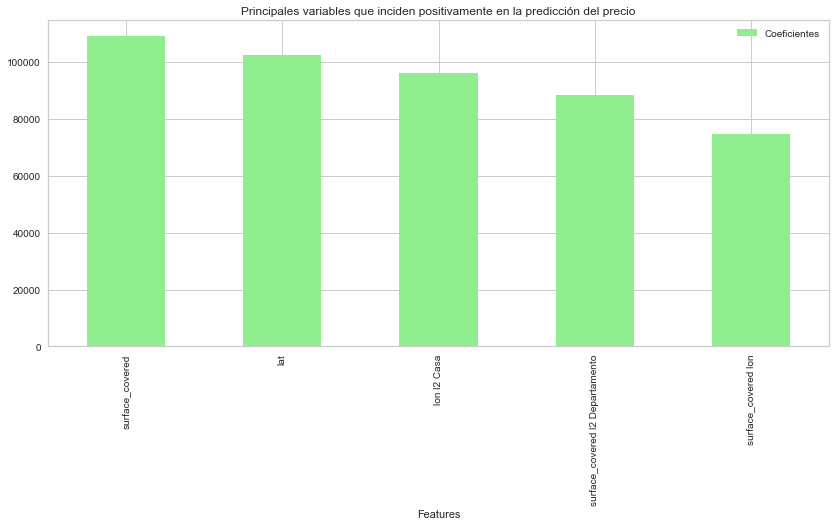

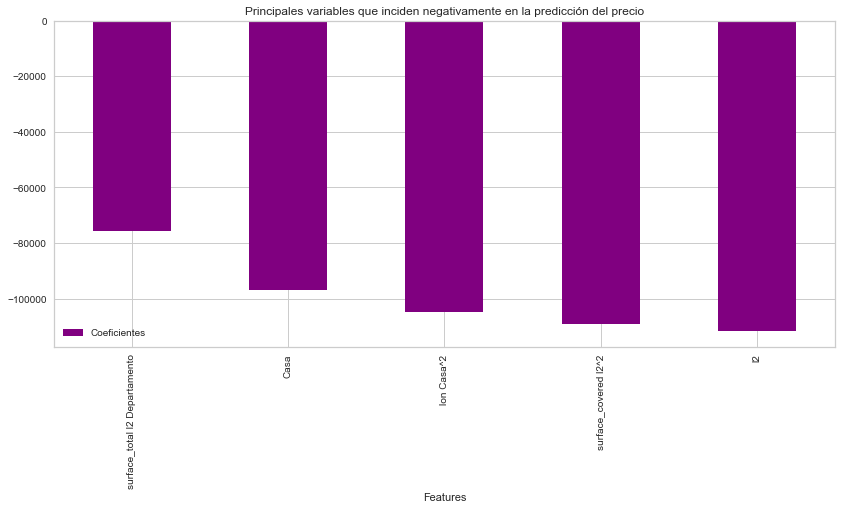

In [325]:
plt.figure(figsize=(14,6))

lasso.head(5).plot(kind='bar',figsize=(14,6),color ='lightgreen',title='Principales variables que inciden positivamente en la predicción del precio')
lasso.tail(5).plot(kind='bar',figsize=(14,6),color='purple',title='Principales variables que inciden negativamente en la predicción del precio')


### 9. b) ¿Coincide con lo que esperabas a partir de tu experiencia con este dataset?

- La relevancia de surface_covered y lon en ambos modelos eran de esperar, ya que son variables determinantes en el precio, que indican el tamaño y la ubicación de la propiedad. A su vez, también fueron relevantes en el Proyecto 1 al determinar la variable dependiente.

- El **modelo XGBoost** muestra que las variables más relevantes son las más intuitivas al momento de determinar el precio de una propiedad: superficie total, cubierta y la ubicación.

- Las variables independientes relevantes en la **Regresión con Lasso** no son lo que esperaba, ya que no incluye a surface_total como una de las más importantes.  Una conclusión importante de la Regresión es que la variable l2, que toma valor 0 si la propiedad es de Capital Federal y 1 si es de provincia, influye negativamente en el precio. Esto tiene sentido ya que las propiedades de Gran Buenos Aires suelen ser más baratas en provincia.

### 10. a) Distribución de los errores en la Regresión con Lasso

- Gráfico de los residuos en función de los valores ajustados por el modelo

In [326]:
fig = px.scatter(x=y_test, y=y_test_pred_lineal2,color_discrete_sequence=['purple'],labels={'x':'y en test','y':'y predicha'})
fig.update_layout(xaxis_title='Valor de y',yaxis_title='Valor de y predicho',title_text='Regresión con Lasso: Valor de y vs valor de y predicho en test')
fig.show()


- A medida que uno recorre el gráfico con el mouse, puede ir viendo la diferencia entre el valor efectivo de y y su estimación.

- La diferencia entre los verdaderos valores de y y los predichos en train muestra que el modelo de Regresión Lineal con Lasso en algunos casos **predice precios negativos**. A su vez, la diferencia entre valores parece no ser tan significativa en la mayoría de la distribución aunque el rmse del modelo en test puede llegar a ser considerado alto en términos relativos (aprox 89000).

### 10. b) Distribución de los errores con XGBoost

In [327]:
fig = px.scatter(x=y_test, y=y_test_predxg2,color_discrete_sequence=['green'],labels={'x':'y en test','y':'y predicha'})
fig.update_layout(xaxis_title='Valor de y',yaxis_title='Valor de y predicho',title_text='XGBoost: Valor de y vs valor de y predicho en test')
fig.show()


- **XGBoost** tiene un rmse menor en test (aprox 48000) pero es mayor la diferencia que existe con rmse train, por lo que puede llegar a dar indicio de overfitting. 

- En este caso, el modelo predice algunos valores negativos para precio pero en menor cantidad que la regresión anterior, aunque existen importantes errores para los valores más altos de y: por ejemplo, predice -49 mil cuando el valor de y es de casi 1 millón.

#### Conclusiones del análisis de errores:

- Ambos modelos muestran una correcta performance en los valores medios de y, pero no se mantiene al llegar a los extremos de la distribución de la variable.

- Mi opinión es que esto puede deberse a que la distribución de la variable precio no es uniforme y pueden haber quedado outliers que disminuyen la exactitud en la predicción del modelo, aunque considero que el análisis de outliers en el preprocesamiento de datos fue poco conservador.

#### Conclusiones del trabajo en general:

- Considero que la parte de preprocesamiento de datos es fundamental para lograr un modelo correcto de Machine Learning. En mi caso, intenté eficientizar lo más posible la base de datos, aunque seguramente me han faltado elementos y conclusiones a tener en cuenta. En un futuro, trabajando en equipo, se puede incorporar más de un punto de vista y mejorar el preprocesamiento en conjunto.

- Estoy conforme con los resultados obtenidos en los modelos de Machine Learning desarrollados. Sin embargo, considero que debo seguir estudiando en profundidad cada uno de ellos y el funcionamiento de sus hiperparámetros para optimizar su performance.

## Proyecto 4

Para el informe final de carrera me propongo trabajar la base de datos del mercado inmobiliario que utilizamos en el Proyecto 2 a través de clusters, utilizando una técnica que no vimos durante la cursada: **hierarchy clustering**. Si bien ya estudiamos la relación de las variables que componen el dataset, haciendo que no sea aplicable una técnica de aprendizaje no supervisado, considero que es una herramienta importante para tener en cuenta en futuros trabajos.

- En este caso, la pregunta a responder sería si resulta posible aglomerar las propiedades en clústeres con características similares, suponiendo que sólo conocemos alguna de las variables disponibles. Esto permitiría agilizar el análisis pertinente al momento de ofrecer propiedades al interesado.

- **1:** Se prepara nuevamente el dataset.

In [328]:
import pandas as pd
import numpy as np
import seaborn as sn
import matplotlib.pyplot as plt

In [329]:
prop=pd.read_csv('Properati.csv')
print(f'Nombre de las columnas:\n{list(prop.columns)}')

Nombre de las columnas:
['start_date', 'end_date', 'created_on', 'lat', 'lon', 'l1', 'l2', 'l3', 'rooms', 'bedrooms', 'bathrooms', 'surface_total', 'surface_covered', 'price', 'currency', 'title', 'description', 'property_type', 'operation_type']


Algunas de las columnas no van a servir para el análisis, por lo que deben eliminarse.

In [330]:
prop.drop(['start_date','end_date','created_on','currency','title','description','operation_type','l1'],axis=1,inplace=True)

- **2:** Teniendo en cuenta las diferencias de precios en las zonas que incluye la base, voy a tomar únicamente Capital Federal para facilitar el análisis de los clústers.

In [331]:
l2=prop['l2'].value_counts()
print('Cantidad de registros por zona \n'+ str(l2))
prop = prop[prop.l2 == 'Capital Federal']

Cantidad de registros por zona 
Capital Federal             92539
Bs.As. G.B.A. Zona Norte    24282
Bs.As. G.B.A. Zona Sur      17173
Bs.As. G.B.A. Zona Oeste    12666
Name: l2, dtype: int64


In [332]:
import plotly.express as px
prop.rename(columns={'l3':'Barrio'},inplace=True)
fig = px.histogram(prop, x='Barrio', title="Cantidad de registros por barrio de Capital Federal", color = 'Barrio',hover_name="Barrio")
fig.update_xaxes(categoryorder='total ascending')
fig.update_yaxes(title_text='Cantidad de registros')
fig.show()

- **3:** Elimino outliers teniendo en cuenta los filtros utilizados en el proyecto 2. Los mismos son:
    - Superficie total: entre 10 y 450 m2
    - Superficie cubierta: entre 10 y 320 m2
    - Precio: menor a 1.000.000 USD

In [333]:
mascara=prop['surface_covered']<320
mascara2=prop['surface_total']<450
prop=prop[mascara&mascara2]
mascara3=prop['surface_covered']>10
mascara4=prop['surface_total']>10
prop=prop[mascara3&mascara4]

In [334]:
prop=prop[prop.price <=1000000]

- **4:** Analizar distintas formas de agrupar el dataset. 

  **4 a)** Una forma posible es a través del **tipo de propiedad** registrada.

In [335]:
print(f'Tipo de propiedad disponible en Capital Federal \n{prop.property_type.value_counts()}')

Tipo de propiedad disponible en Capital Federal 
Departamento       67735
PH                  9456
Casa                1825
Oficina              305
Otro                  64
Local comercial       14
Lote                   7
Depósito               1
Cochera                1
Name: property_type, dtype: int64


- Al ser un análisis de datos no supervisado, lo ideal sería **eliminar** todos los tipos de propiedad que registren menos de 2.000 datos ya que sería muy confuso para el armado de cluster que agrupe tipos de propiedad que pueden tener características muy distintas. Por ejemplo, no sería correcto agrupar Cochera con local comercial: puede diferir significativamente la cantidad de m2, como así tambien la cantidad de ambientes. 

In [336]:
masc=prop.property_type.isin((['PH', 'Departamento', 'Casa']))
prop=prop[masc]

**Hierarchical clustering (intento 1)**: clustering considerando ubicación, superficie total y cubierta

In [337]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch

In [338]:
prop.dropna(inplace=True)

Aclaración: Se utilizan 10.000 observaciones para realizar el cluster por la incapacidad en cuanto a memoria al utilizar mayor cantidad de filas

Text(0.5, 1.0, 'Hierarchical cluster 1')

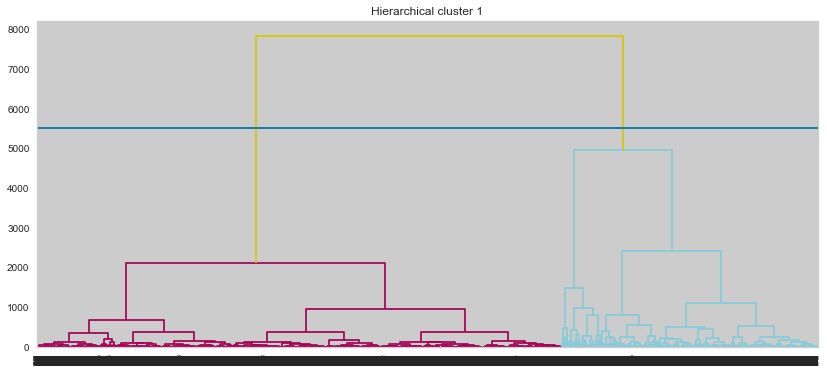

In [339]:
X=prop.iloc[:, [0,1,7,8]].values
X=X[:10000]
sch.set_link_color_palette(['m', 'c', 'y'])
plt.figure(figsize=(14,6))
dendrogram = sch.dendrogram(sch.linkage(X, method='ward'), above_threshold_color='y',
                            orientation='top')
plt.axhline(y=5500, xmin=0, xmax=500)
plt.title('Hierarchical cluster 1')

In [340]:
model = AgglomerativeClustering(n_clusters=3, affinity='euclidean')
model.fit(X)
labels = model.labels_

In [341]:
from scipy.cluster.hierarchy import single, cophenet
from scipy.spatial.distance import pdist, squareform

- Métrica de evaluación para el cluster 1: Índice de Silueta

In [342]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from yellowbrick.cluster import SilhouetteVisualizer


list_k = list(range(2, 5))

for n_clusters in list_k:
    clusterer = KMeans(n_clusters=n_clusters)
    preds = clusterer.fit_predict(X)
    centers = clusterer.cluster_centers_

    score = silhouette_score (X, preds)
    print ("Cluster N" + str(n_clusters) + " el score de silueta es: " + str(score))

Cluster N2 el score de silueta es: 0.6772741482916779
Cluster N3 el score de silueta es: 0.5979017870397323
Cluster N4 el score de silueta es: 0.5436240054397835


El valor de la silueta significa que, cuanto mas cercano a 1, las observaciones están más cerca de las otras observaciones miembro del clúster. En este caso, el cluster 2 sería el que está más condensado.

C:\Users\florb\miniconda3\envs\datascience\lib\site-packages\sklearn\base.py:193: FutureWarning:

From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.



SilhouetteVisualizer(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x000002003410D910>,
                     colors='yellowbrick', is_fitted='auto', model=None)

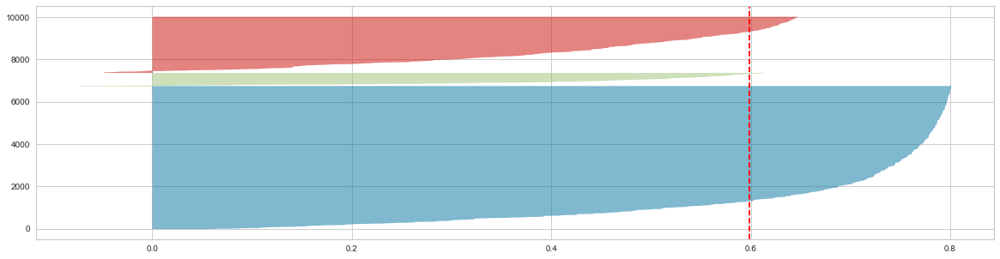

In [343]:
# Genero un modelo con K=3 y grafico el visualizador de silueta
model = KMeans(3, random_state=0)

visualizer = SilhouetteVisualizer(model, colors='yellowbrick')   
visualizer.fit(X)                                          


- El Visualizador de Silueta muestra una clara diferencia entre las densidades de los clusteres, estando casi todas las propiedades aglomeradas en el primer clúster.

**Hierarchical clustering (intento 2)**: clustering considerando ubicación, cantidad de ambientes y precio

In [344]:
prop.head(1)

,lat,lon,l2,Barrio,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,property_type
0,-34.60588,-58.384949,Capital Federal,San Cristobal,7.0,7.0,2.0,140.0,140.0,153000.0,Departamento


Text(0.5, 1.0, 'Hierarchical cluster 2')

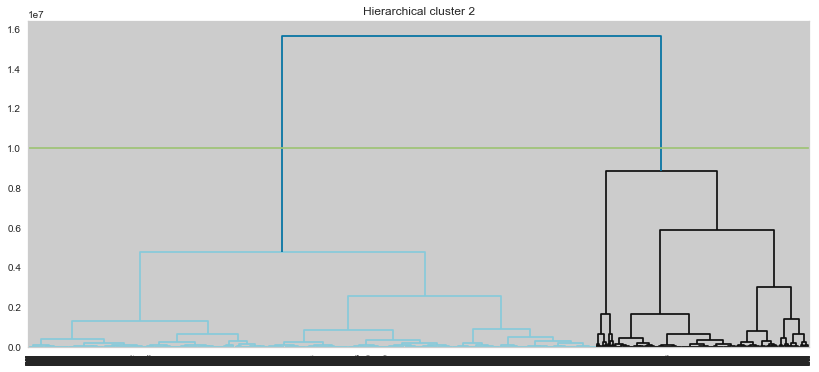

In [345]:
Y=prop.iloc[:, [0,1,4,9]].values
Y=Y[:10000]
sch.set_link_color_palette(['c', 'k', 'm'])
plt.figure(figsize=(14,6))
dendrogram = sch.dendrogram(sch.linkage(Y, method='ward'),
                            orientation='top')
plt.axhline(y=1.0e7, xmin=0, xmax=500, color='g')
plt.title('Hierarchical cluster 2')

In [346]:
model2 = AgglomerativeClustering(n_clusters=3, affinity='euclidean')
model2.fit(Y)
labels2 = model2.labels_

In [347]:
list_k = list(range(2, 5))

for n_clusters in list_k:
    clusterer2 = KMeans(n_clusters=n_clusters)
    preds2 = clusterer.fit_predict(Y)
    centers2 = clusterer.cluster_centers_

    score2 = silhouette_score (Y, preds2)
    print ("Cluster N" + str(n_clusters) + " el score de silueta es: " + str(score2))

Cluster N2 el score de silueta es: 0.579234072083862
Cluster N3 el score de silueta es: 0.577516712154692
Cluster N4 el score de silueta es: 0.5792487867447016


C:\Users\florb\miniconda3\envs\datascience\lib\site-packages\sklearn\base.py:193: FutureWarning:

From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.



SilhouetteVisualizer(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x000001FFE9DC0820>,
                     colors='sns_pastel', is_fitted='auto', model=None)

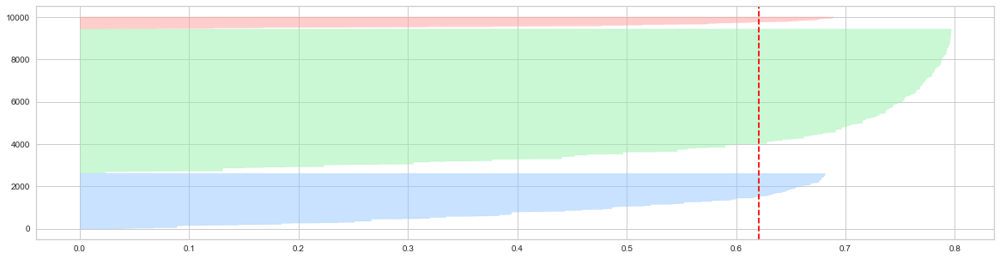

In [348]:
model2 = KMeans(3, random_state=0)

visualizer2 = SilhouetteVisualizer(model2, colors='sns_pastel')   
visualizer2.fit(Y)   

- En este caso, el aglomeramiento de las observaciones se produce en el cluster 2. A diferencia del primer cluster, los tres grupos pueden considerarse significativos.

**Conclusiones:** Hay mucho material disponible para continuar investigando sobre aprendizaje no supervisado. En los dos datasets utilizados en los Proyectos trabajamos con datos que pueden no ser los indicados para desarrollar esta rama del Machine Learning. Sin embargo, me parece muy importante conocer los diferentes mecanismos para aplicar en el ámbito laboral.